In [ ]:
from google.colab import files
uploaded = files.upload()

Saving test_data.csv to test_data.csv
Saving train_data.csv to train_data.csv


In [ ]:
import io
import pandas as pd

#df_train = pd.read_csv(io.StringIO(uploaded['train_data.csv'].decode('utf-8'))).drop(['out_pressure'],axis=1)
#df_test = pd.read_csv(io.StringIO(uploaded['test_data.csv'].decode('utf-8'))).drop(['out_pressure'],axis=1)

df_train = pd.read_csv('train_data.csv', encoding='utf-8')#.drop(['motor_vibe'],axis=1)
df_train_raw = df_train.copy()
df_test = pd.read_csv('test_data.csv', encoding='utf-8')#.drop(['motor_vibe'],axis=1)
df_test_raw = df_test.copy()

In [ ]:
# train 마력 변환
df_train['force'] = df_test_raw['type']
for i in range(len(df_train)):
  if df_train['type'][i] in [0,4,5,6,7]:
     df_train['force'][i] = 30
  elif df_train['type'][i] == 1:
     df_train['force'][i] = 20
  elif df_train['type'][i] == 2:
     df_train['force'][i] = 10
  elif df_train['type'][i] == 3:
     df_train['force'][i] = 50
df_train = df_train.drop(['type'],axis=1)

# test 마력 변환
df_test['force'] = df_test_raw['type']
for i in range(len(df_test)):
  if df_test['type'][i] in [0,4,5,6,7]:
     df_test['force'][i] = 30
  elif df_test['type'][i] == 1:
     df_test['force'][i] = 20
  elif df_test['type'][i] == 2:
     df_test['force'][i] = 10
  elif df_test['type'][i] == 3:
     df_test['force'][i] = 50
df_test = df_test.drop(['type'],axis=1)

<ipython-input-440-9d4df637ec9d>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_train['force'][i] = 30
<ipython-input-440-9d4df637ec9d>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_train['force'][i] = 20
<ipython-input-440-9d4df637ec9d>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_train['force'][i] = 10
<ipython-input-440-9d4df637ec9d>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from

In [ ]:
df_train['type'] = df_train_raw['type']
df_test['type'] = df_test_raw['type']

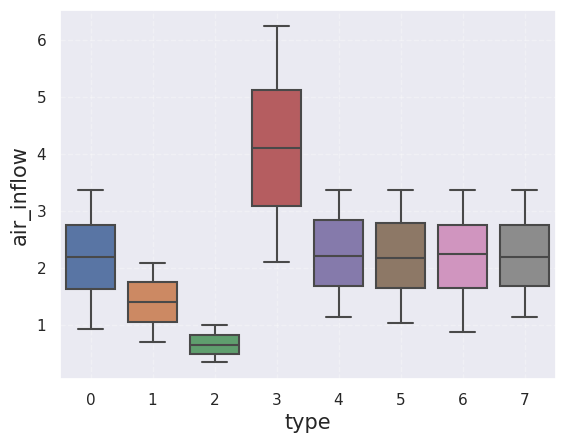

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

x = sns.boxplot(x='type', y='air_inflow', hue='type', data=df_test, dodge=False)
x.get_legend().remove()
plt.xlabel('type', size=15)
plt.ylabel('air_inflow',size=15)
plt.ylim()
plt.grid(True, alpha=0.3, linestyle="--")
plt.show()

In [ ]:
from sklearn.manifold import TSNE

# class target 정보 제외
train_df = df_test[['air_inflow', 'air_end_temp', 'out_pressure', 'motor_current',
       'motor_rpm', 'motor_temp', 'motor_vibe']]

# 2차원 t-SNE 임베딩
tsne_np = TSNE(n_components = 2).fit_transform(train_df)

# numpy array -> DataFrame 변환
tsne_df = pd.DataFrame(tsne_np, columns = ['component 0', 'component 1'])

In [ ]:
#tsne_df_train = tsne_df
#tsne_df_test = tsne_df

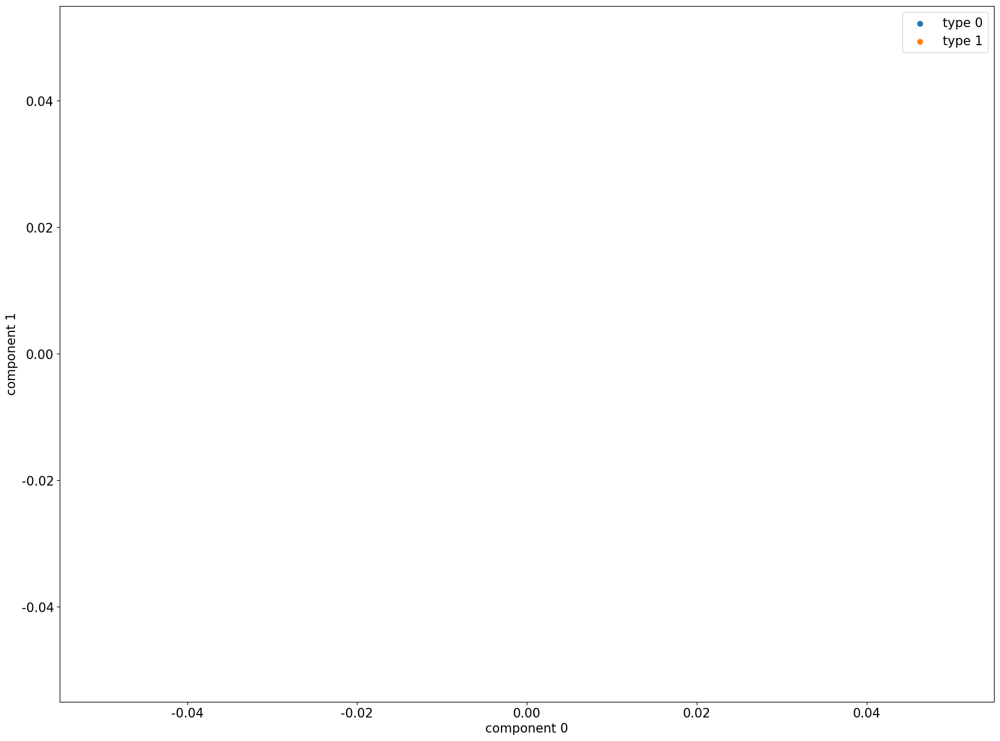

In [ ]:
import matplotlib.pyplot as plt

# class target 정보 불러오기 
tsne_df['type'] = df_train['type']

# target 별 분리
tsne_df_0 = tsne_df[tsne_df['type'] == 0]
tsne_df_1 = tsne_df[tsne_df['type'] == 1]
#tsne_df_2 = tsne_df[tsne_df['type'] == 2]
#tsne_df_3 = tsne_df[tsne_df['type'] == 3]
#tsne_df_4 = tsne_df[tsne_df['type'] == 4]
#tsne_df_5 = tsne_df[tsne_df['type'] == 5]
#tsne_df_6 = tsne_df[tsne_df['type'] == 6]
#tsne_df_7 = tsne_df[tsne_df['type'] == 7]

# target 별 시각화
plt.scatter(tsne_df_0['component 0'], tsne_df_0['component 1'], label = 'type 0')
plt.scatter(tsne_df_1['component 0'], tsne_df_1['component 1'], label = 'type 1')
#plt.scatter(tsne_df_2['component 0'], tsne_df_2['component 1'], label = 'type 2')
#plt.scatter(tsne_df_3['component 0'], tsne_df_3['component 1'], label = 'type 3')
#plt.scatter(tsne_df_4['component 0'], tsne_df_4['component 1'], label = 'type 4')
#plt.scatter(tsne_df_5['component 0'], tsne_df_5['component 1'], label = 'type 5')
#plt.scatter(tsne_df_6['component 0'], tsne_df_6['component 1'], label = 'type 6')
#plt.scatter(tsne_df_7['component 0'], tsne_df_7['component 1'], label = 'type 7')

plt.xlabel('component 0')
plt.ylabel('component 1')
plt.legend()
plt.show()

In [ ]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
from sklearn.mixture import GaussianMixture
import numpy as np

In [ ]:
df_train_0 = df_train[df_train['type'].values==[0]]
df_train_1 = df_train[df_train['type'].values==[1]]
df_train_2 = df_train[df_train['type'].values==[2]]
df_train_3 = df_train[df_train['type'].values==[3]]
df_train_4 = df_train[df_train['type'].values==[4]]
df_train_5 = df_train[df_train['type'].values==[5]]
df_train_6 = df_train[df_train['type'].values==[6]]
df_train_7 = df_train[df_train['type'].values==[7]]
#df_train = df_train_7

df_test_0 = df_test[df_test['type'].values==[0]]
df_test_1 = df_test[df_test['type'].values==[1]]
df_test_2 = df_test[df_test['type'].values==[2]]
df_test_3 = df_test[df_test['type'].values==[3]]
df_test_4 = df_test[df_test['type'].values==[4]]
df_test_5 = df_test[df_test['type'].values==[5]]
df_test_6 = df_test[df_test['type'].values==[6]]
df_test_7 = df_test[df_test['type'].values==[7]]
#df_test = df_test_7

In [ ]:
def Scaler(df_train, df_test):
  scaler_ = RobustScaler()
  scaler_.fit(df_train)
  df_scaled_ = scaler_.transform(df_train)
  scaled_df = pd.DataFrame(df_scaled_, columns=df_train.columns)
  df_train = scaled_df

  scaler_.fit(df_test)
  df_scaled_ = scaler_.transform(df_test)
  scaled_df = pd.DataFrame(df_scaled_, columns=df_test.columns)
  df_test = scaled_df

  return df_train, df_test


#df_train,df_test = Scaler(df_train,df_test)
df_train_0,df_test_0 = Scaler(df_train_0,df_test_0)
df_train_1,df_test_1 = Scaler(df_train_1,df_test_1)
df_train_2,df_test_2 = Scaler(df_train_2,df_test_2)
df_train_3,df_test_3 = Scaler(df_train_3,df_test_3)
df_train_4,df_test_4 = Scaler(df_train_4,df_test_4)
df_train_5,df_test_5 = Scaler(df_train_5,df_test_5)
df_train_6,df_test_6 = Scaler(df_train_6,df_test_6)
df_train_7,df_test_7 = Scaler(df_train_7,df_test_7)

Text(0.5, 0, 'n_components')

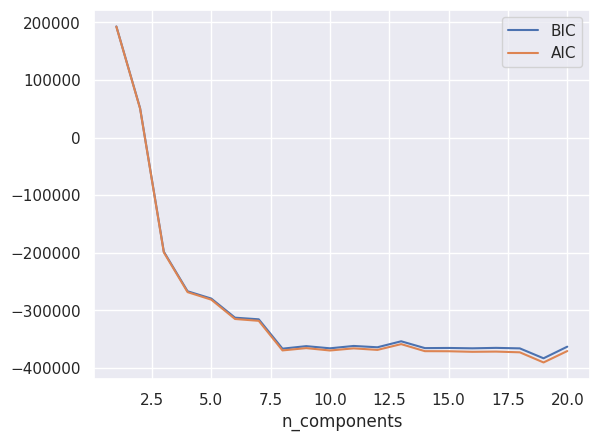

In [ ]:
import matplotlib.pyplot as plt
n_components = np.arange(1, 21)
models = [GaussianMixture(n, covariance_type='full', random_state=0).fit(df_test) for n in n_components]
plt.plot(n_components, [m.bic(df_test) for m in models], label='BIC')
plt.plot(n_components, [m.aic(df_test) for m in models], label='AIC')
plt.legend(loc='best')
plt.xlabel('n_components')

In [ ]:
gm = GaussianMixture(n_components=19, n_init=10, random_state=0, covariance_type='full', init_params='kmeans')
gm.fit(df_train)

GaussianMixture(n_components=19, n_init=10, random_state=0)

In [ ]:
gm.weights_
gm.means_
gm.covariances_
gm.converged_
gm.n_iter_
gm.predict(df_test)
gm.predict_proba(df_test)
df_test

,air_inflow,air_end_temp,out_pressure,motor_current,motor_rpm,motor_temp,motor_vibe,force,type
0,2.51,53.28,0.7,32.54,2662.0,69.58,3.48,30,0
1,2.66,55.24,0.7,34.45,2819.0,71.32,3.57,30,0
2,1.72,42.74,0.7,22.23,1819.0,60.21,3.01,30,0
3,2.20,49.15,0.7,28.50,2332.0,65.91,3.30,30,0
4,2.06,47.28,0.7,26.67,2182.0,64.24,3.21,30,0
...,...,...,...,...,...,...,...,...,...
7384,2.12,48.08,0.7,27.45,2246.0,64.96,3.25,30,7
7385,1.48,39.63,0.7,19.19,1570.0,57.44,2.87,30,7
7386,1.56,40.61,0.7,20.15,1649.0,58.32,2.92,30,7
7387,1.59,40.99,0.7,20.52,1679.0,58.66,2.93,30,7


In [ ]:
densities = gm.score_samples(df_test)

df_test['cluster'] = gm.predict(df_test)

density_threshold = 0 #np.percentile(densities, 4.68)
anomalies = df_test[densities <= density_threshold]
normal = df_test[densities > density_threshold]

Text(0.5, 0, 'densities')

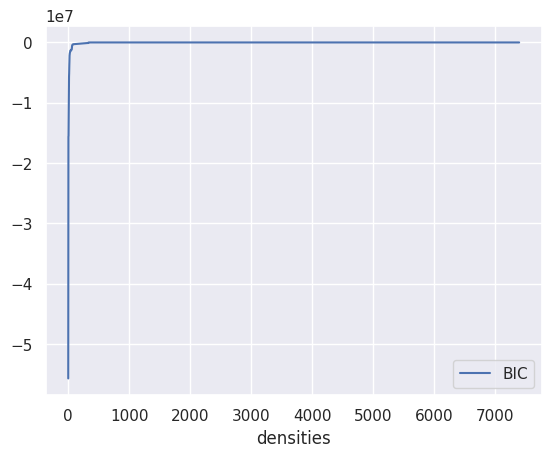

In [ ]:
import matplotlib.pyplot as plt
plt.plot(sorted(densities), label='BIC')
plt.legend(loc='best')
plt.xlabel('densities')

In [ ]:
sorted(densities)[:60]

[-55692830.91946326,
 -36154689.16922578,
 -18248283.332252745,
 -15585733.137118766,
 -15520666.251039024,
 -15505338.979025904,
 -12895467.528727477,
 -12722462.68325187,
 -11611740.741944695,
 -9990100.777319549,
 -9603433.922624908,
 -5886515.360973604,
 -5857091.335750154,
 -5649137.418408856,
 -5365968.439210815,
 -5085267.909789079,
 -3999539.279920476,
 -3741727.21392811,
 -3642967.4225080633,
 -3348118.785447013,
 -2359717.1719300416,
 -2220665.9459457877,
 -2152020.1946023256,
 -2075960.2334777936,
 -1839792.4821258546,
 -1838498.603588124,
 -1784848.2917533878,
 -1702458.0154562031,
 -1698566.9437176134,
 -1658644.185751402,
 -1621802.7361872902,
 -1539728.1891592566,
 -1436938.3231310388,
 -1351179.6201161158,
 -1350706.77811444,
 -1349637.3152015067,
 -1349101.6866825337,
 -1347712.0649610062,
 -1347166.364412109,
 -1346653.4895754526,
 -1346347.1662360034,
 -1346239.1378985976,
 -1345712.7692766006,
 -1345065.3779163372,
 -1344238.2677625979,
 -1343890.5673443042,
 -12562

In [ ]:
sorted(densities)[300:400]

[-103239.90307370506,
 -102331.12534257541,
 -102311.73395943386,
 -102308.29736528514,
 -100295.04437005891,
 -100272.19808870218,
 -99917.88294462534,
 -99898.4370780235,
 -99894.98958718273,
 -99789.57684651583,
 -99766.54201375408,
 -98903.41759743507,
 -98854.17981605501,
 -96895.62564981145,
 -96455.47382221543,
 -96432.64124163963,
 -95204.85174505133,
 -95181.37943963044,
 -94197.2926749532,
 -94174.1812486232,
 -93760.53779804884,
 -92778.1804429145,
 -92758.3403896986,
 -92754.81406153501,
 -92431.71043266324,
 -92408.49147715479,
 -91499.49420424322,
 -91476.12482471523,
 -91244.05042975994,
 -91220.73925099101,
 -28937.701736568943,
 -22025.864127709494,
 -22024.47940460561,
 -19976.606877804843,
 -19976.489465904993,
 -12776.03359059617,
 -5552.324130946169,
 -4976.924261561215,
 -4976.193110793831,
 -4509.962509127561,
 -3231.263826958842,
 -3216.3390602868685,
 -355.2511793712229,
 -148.16119401208547,
 20.18662024919932,
 20.18662024919932,
 20.328225255976495,
 20.3282

In [ ]:
anomalies['label'] = '1'
normal['label'] = '0'

<ipython-input-452-39c25f86906f>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  anomalies['label'] = '1'
<ipython-input-452-39c25f86906f>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  normal['label'] = '0'


In [ ]:
anomalies

,air_inflow,air_end_temp,out_pressure,motor_current,motor_rpm,motor_temp,motor_vibe,force,type,cluster,label
585,1.38,41.64,0.7,21.10,1651.0,58.34,3.12,30,0,7,1
586,2.06,51.95,0.7,31.64,2476.0,59.34,3.58,30,0,7,1
587,1.35,41.20,0.7,20.65,1616.0,60.34,3.10,30,0,7,1
588,2.86,63.93,0.7,43.88,3434.0,61.34,4.11,30,0,7,1
589,1.62,45.26,0.7,24.80,1941.0,62.34,3.28,30,0,7,1
...,...,...,...,...,...,...,...,...,...,...,...
6800,1.44,50.90,0.7,27.05,2072.0,63.02,3.55,30,6,7,1
7342,1.60,45.04,0.7,24.57,1923.0,61.37,3.27,30,7,7,1
7348,2.76,62.36,0.7,42.28,3309.0,76.77,4.04,30,7,7,1
7359,1.48,43.15,0.7,22.64,1772.0,59.69,3.18,30,7,7,1


In [ ]:
df = pd.concat([normal,anomalies]).sort_index()
df

,air_inflow,air_end_temp,out_pressure,motor_current,motor_rpm,motor_temp,motor_vibe,force,type,cluster,label
0,2.51,53.28,0.7,32.54,2662.0,69.58,3.48,30,0,7,0
1,2.66,55.24,0.7,34.45,2819.0,71.32,3.57,30,0,7,0
2,1.72,42.74,0.7,22.23,1819.0,60.21,3.01,30,0,7,0
3,2.20,49.15,0.7,28.50,2332.0,65.91,3.30,30,0,7,0
4,2.06,47.28,0.7,26.67,2182.0,64.24,3.21,30,0,7,0
...,...,...,...,...,...,...,...,...,...,...,...
7384,2.12,48.08,0.7,27.45,2246.0,64.96,3.25,30,7,7,0
7385,1.48,39.63,0.7,19.19,1570.0,57.44,2.87,30,7,7,0
7386,1.56,40.61,0.7,20.15,1649.0,58.32,2.92,30,7,7,0
7387,1.59,40.99,0.7,20.52,1679.0,58.66,2.93,30,7,7,0


In [ ]:
df_test_raw['type'].value_counts()

0    1296
1    1107
2    1098
3     918
4     918
5     747
6     747
7     558
Name: type, dtype: int64

In [ ]:
df['type'] = df_test_raw['type']

In [ ]:
# 테스트
df['type'][df['label']=='1'].value_counts().sort_index()

0    143
2     27
3     26
4     13
5     30
6    101
7      4
Name: type, dtype: int64

In [ ]:
# 3
df['type'][df['label']=='1'].value_counts().sort_index()

0    143
2     27
3     26
4     13
5     30
6    101
7      4
Name: type, dtype: int64

In [ ]:
df

,air_inflow,air_end_temp,out_pressure,motor_current,motor_rpm,motor_temp,motor_vibe,force,type,label
0,2.51,53.28,0.7,32.54,2662.0,69.58,3.48,30,0,0
1,2.66,55.24,0.7,34.45,2819.0,71.32,3.57,30,0,0
2,1.72,42.74,0.7,22.23,1819.0,60.21,3.01,30,0,0
3,2.20,49.15,0.7,28.50,2332.0,65.91,3.30,30,0,0
4,2.06,47.28,0.7,26.67,2182.0,64.24,3.21,30,0,0
...,...,...,...,...,...,...,...,...,...,...
7384,2.12,48.08,0.7,27.45,2246.0,64.96,3.25,30,7,0
7385,1.48,39.63,0.7,19.19,1570.0,57.44,2.87,30,7,0
7386,1.56,40.61,0.7,20.15,1649.0,58.32,2.92,30,7,0
7387,1.59,40.99,0.7,20.52,1679.0,58.66,2.93,30,7,0


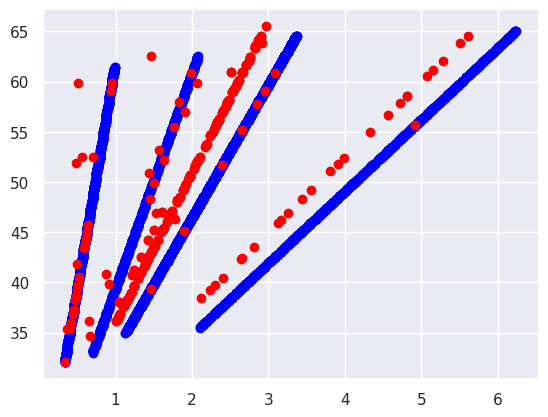

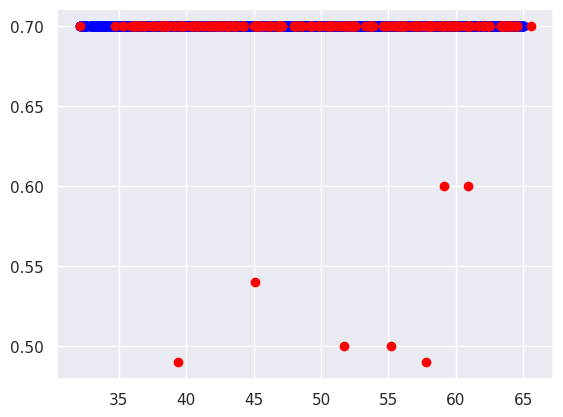

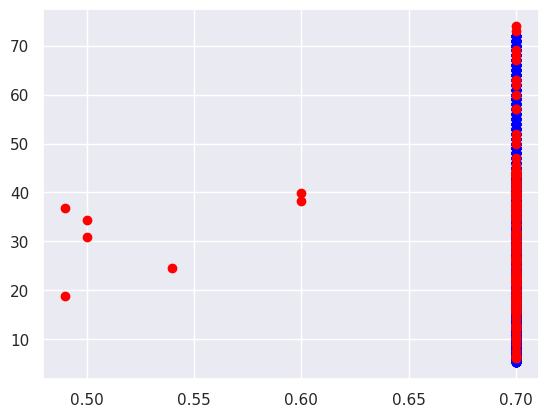

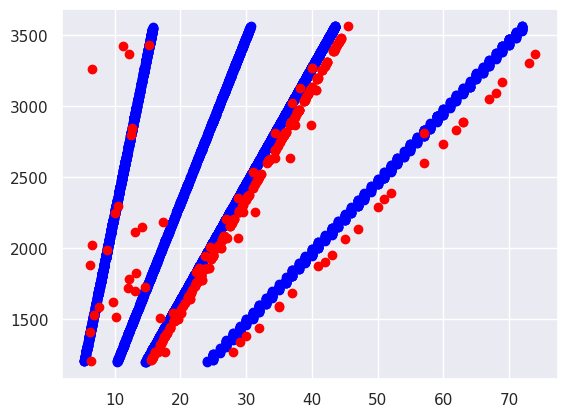

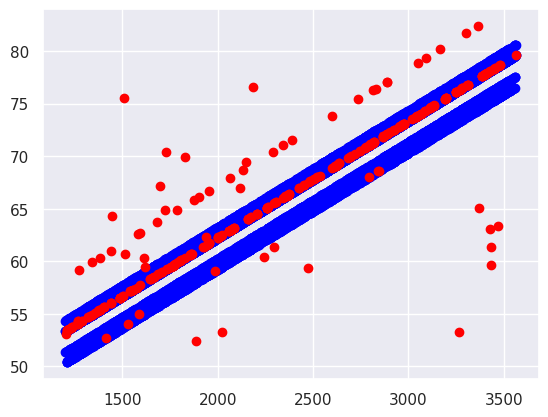

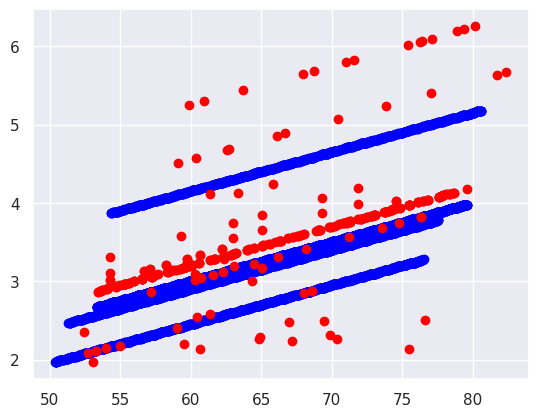

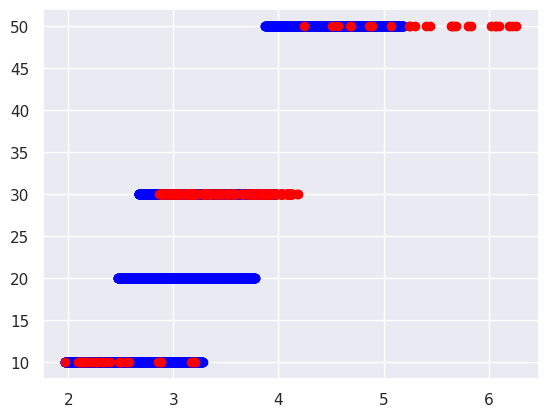

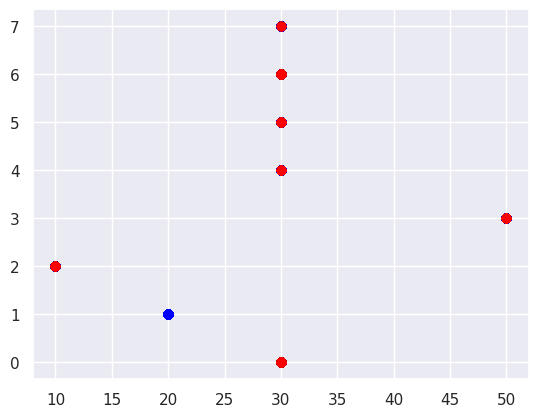

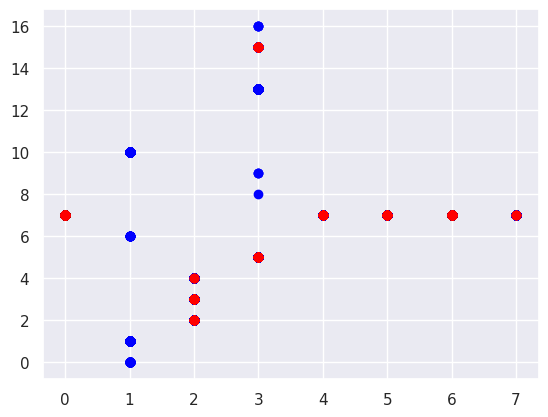

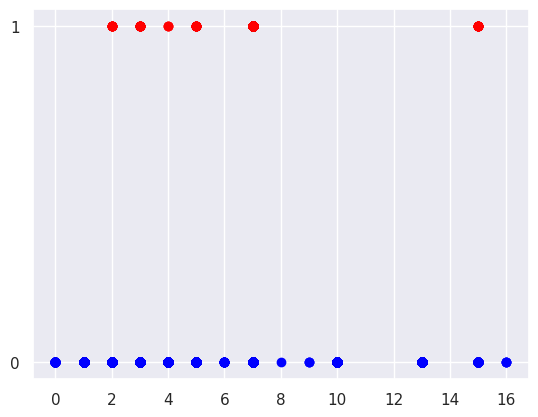

In [ ]:
for i in range(1, len(df.columns)):
  data = df[df["label"]=='0']
  plt.scatter(data[df.columns[i-1]],data[df.columns[i]], c='blue')
  data = df[df["label"]=='1']
  plt.scatter(data[df.columns[i-1]],data[df.columns[i]], c='red')
  plt.show()

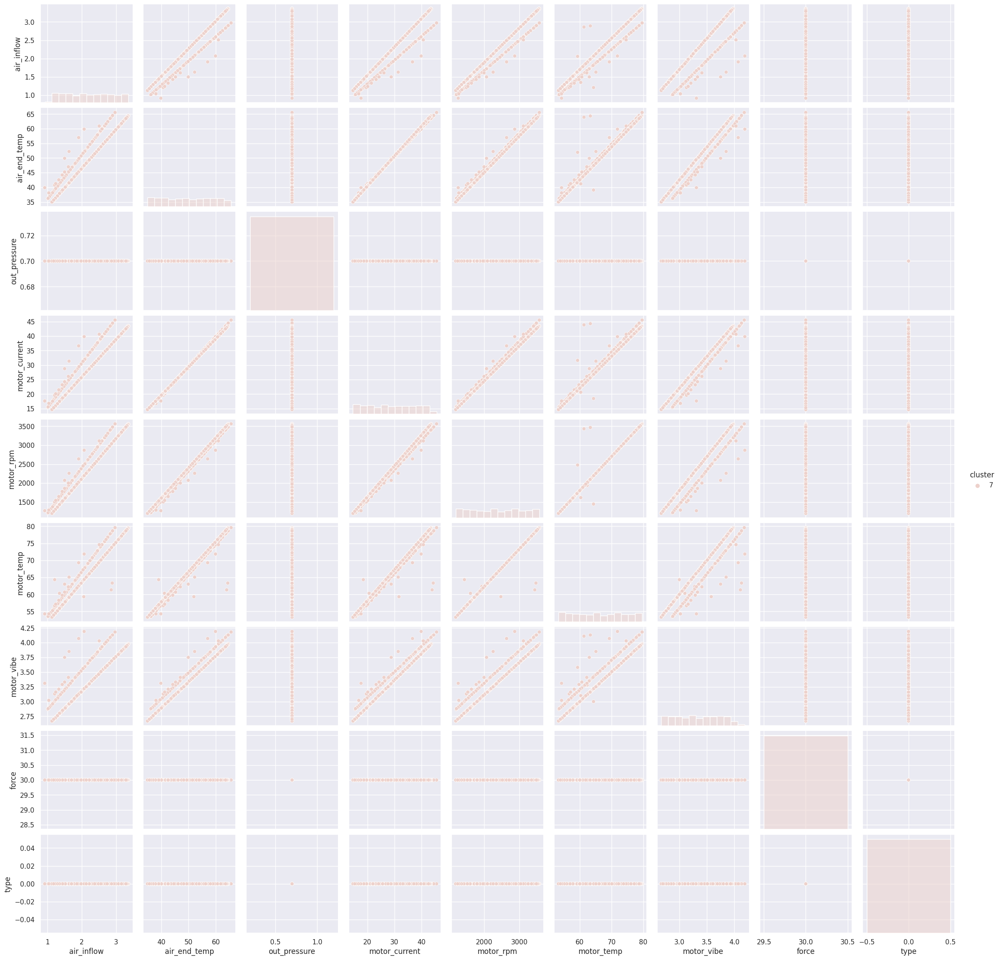

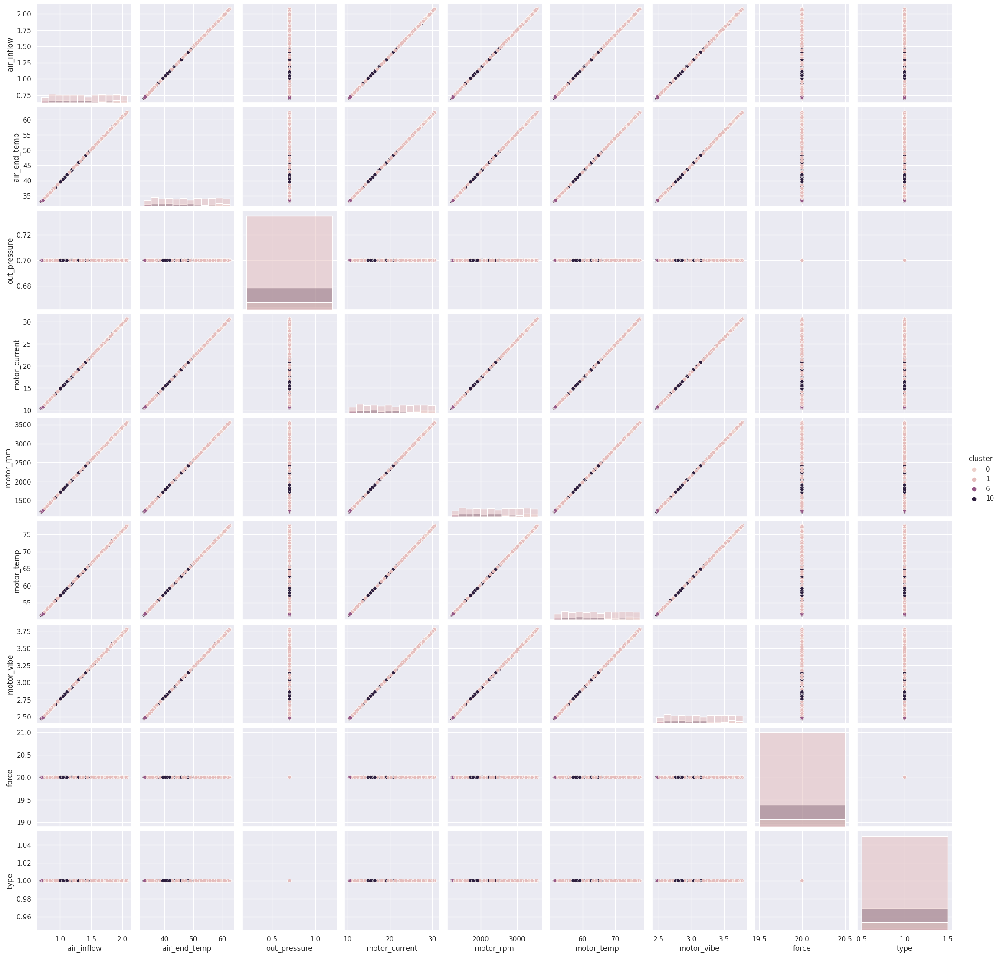

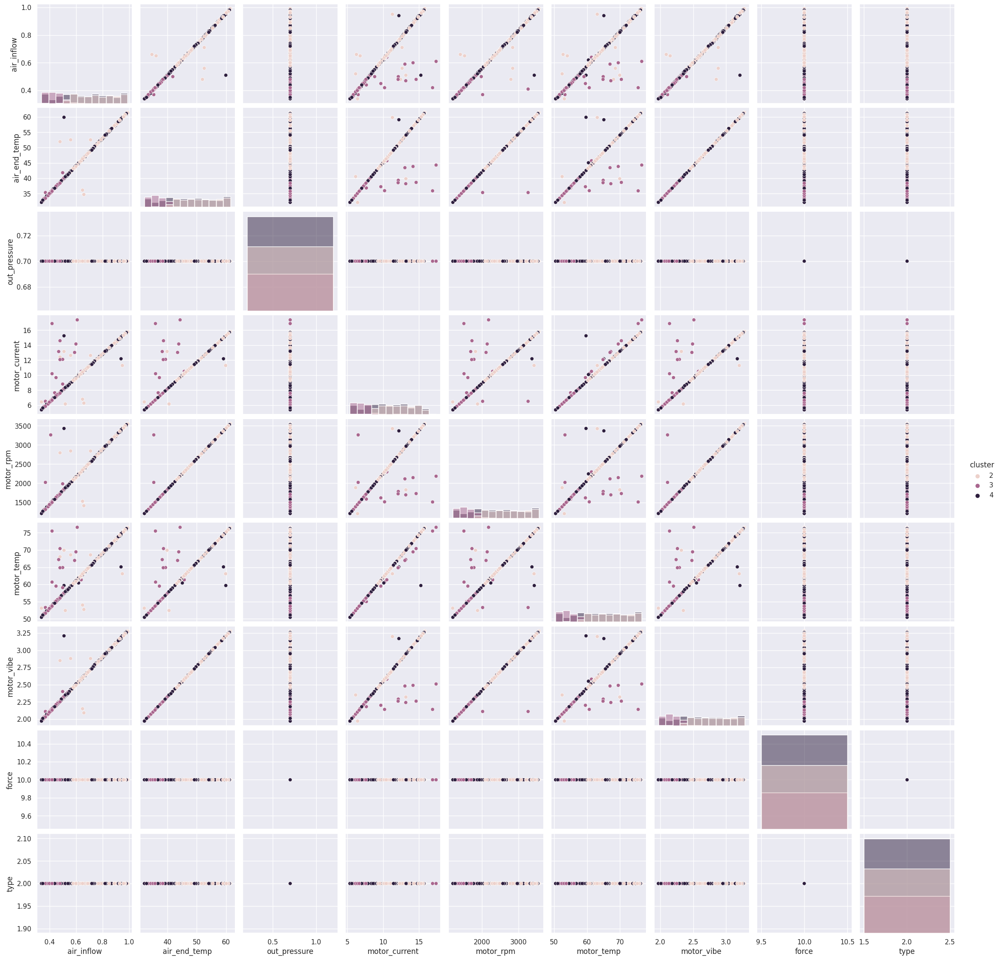

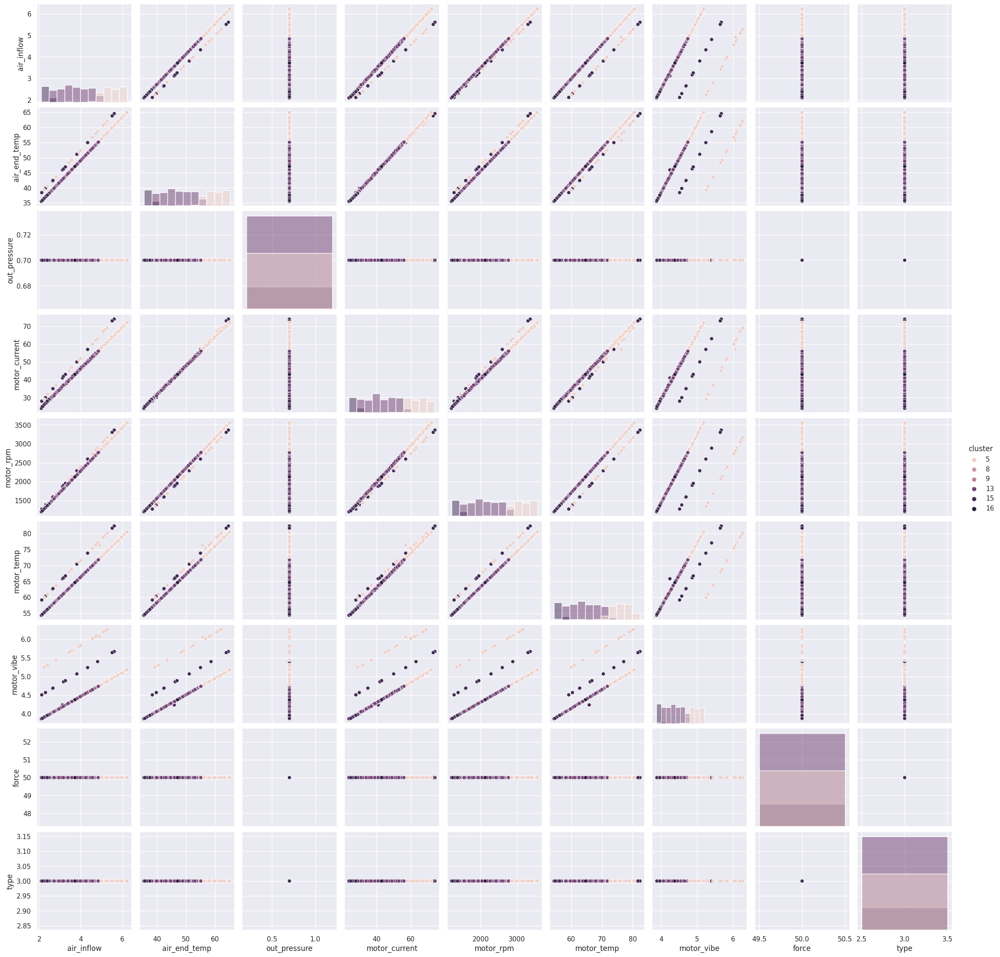

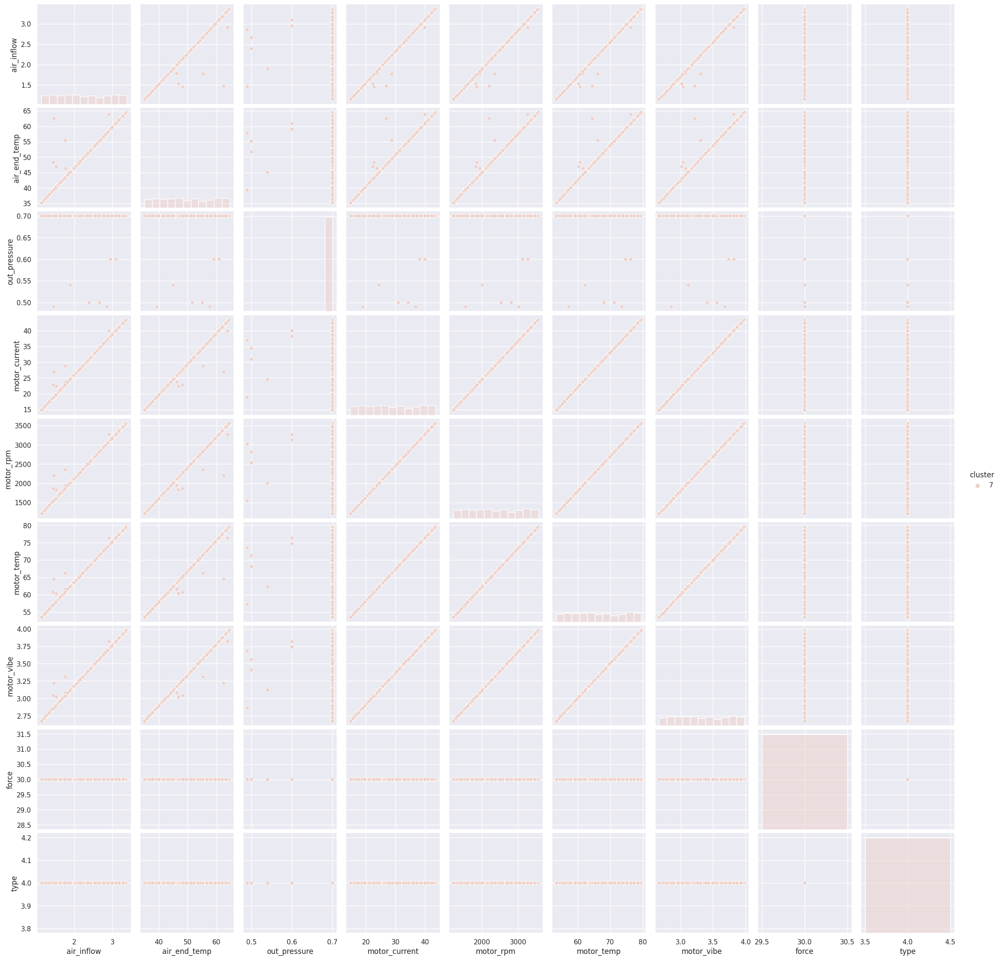

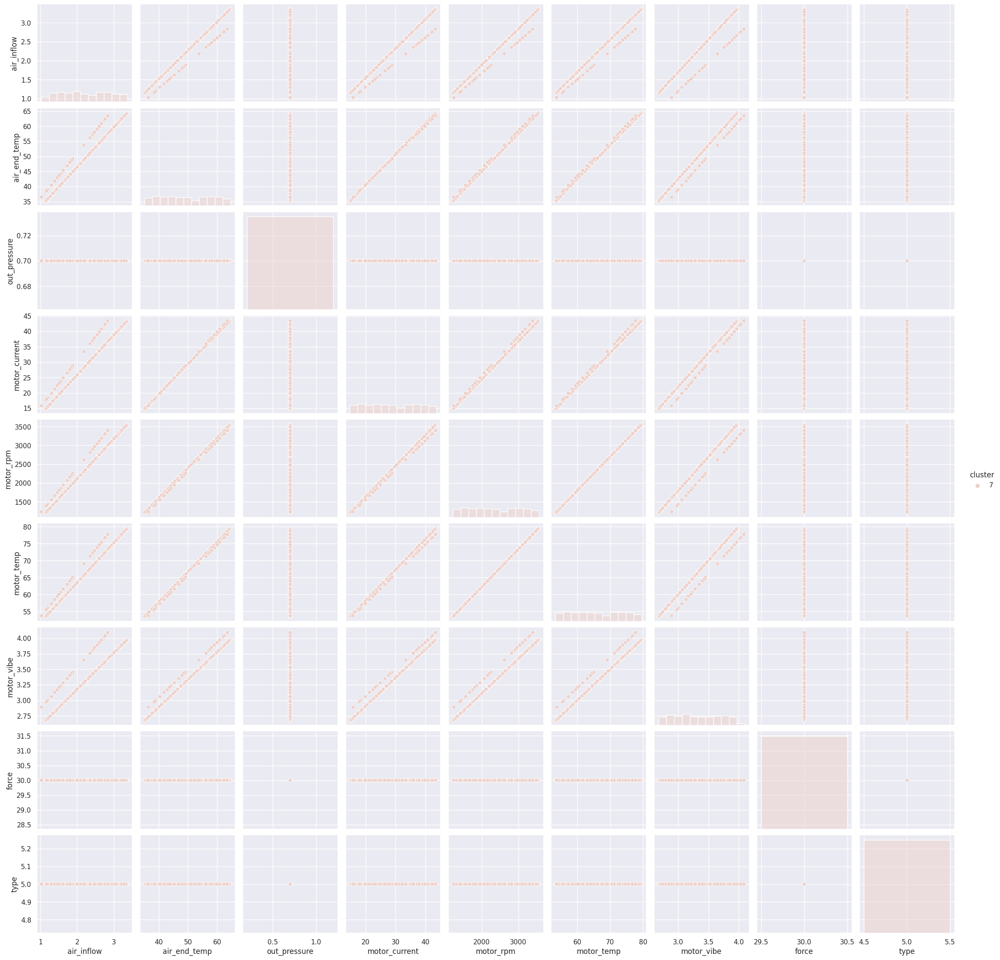

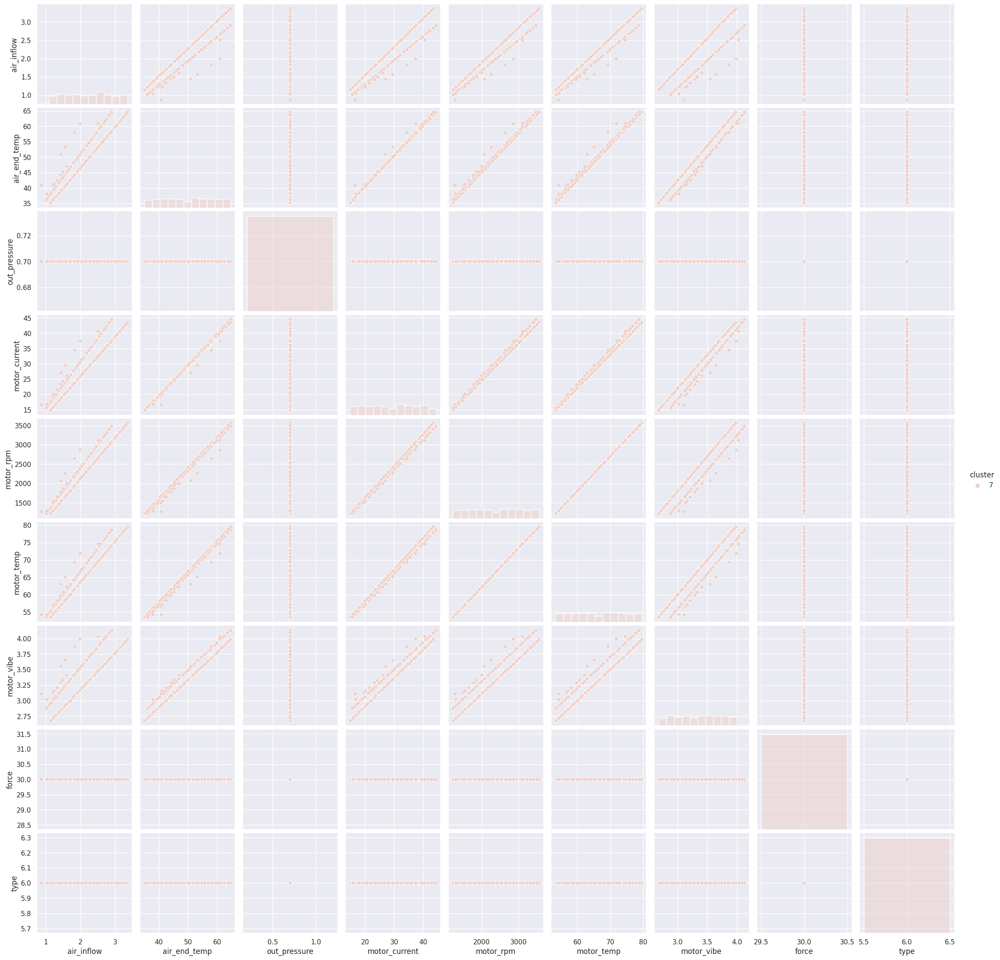

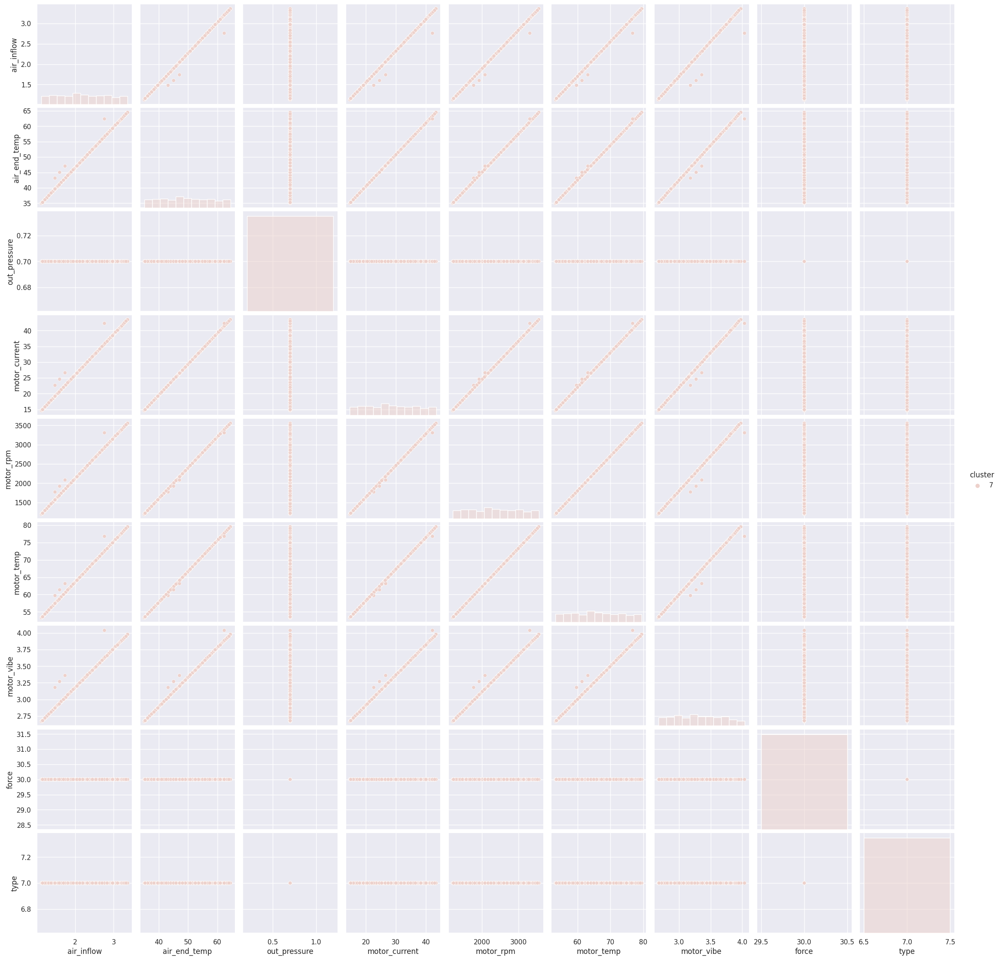

In [ ]:
# 테스트용
import seaborn as sns
for i in df['type'].unique():
	sns.pairplot(df.loc[df['type'] == i],diag_kind='hist',hue='cluster')

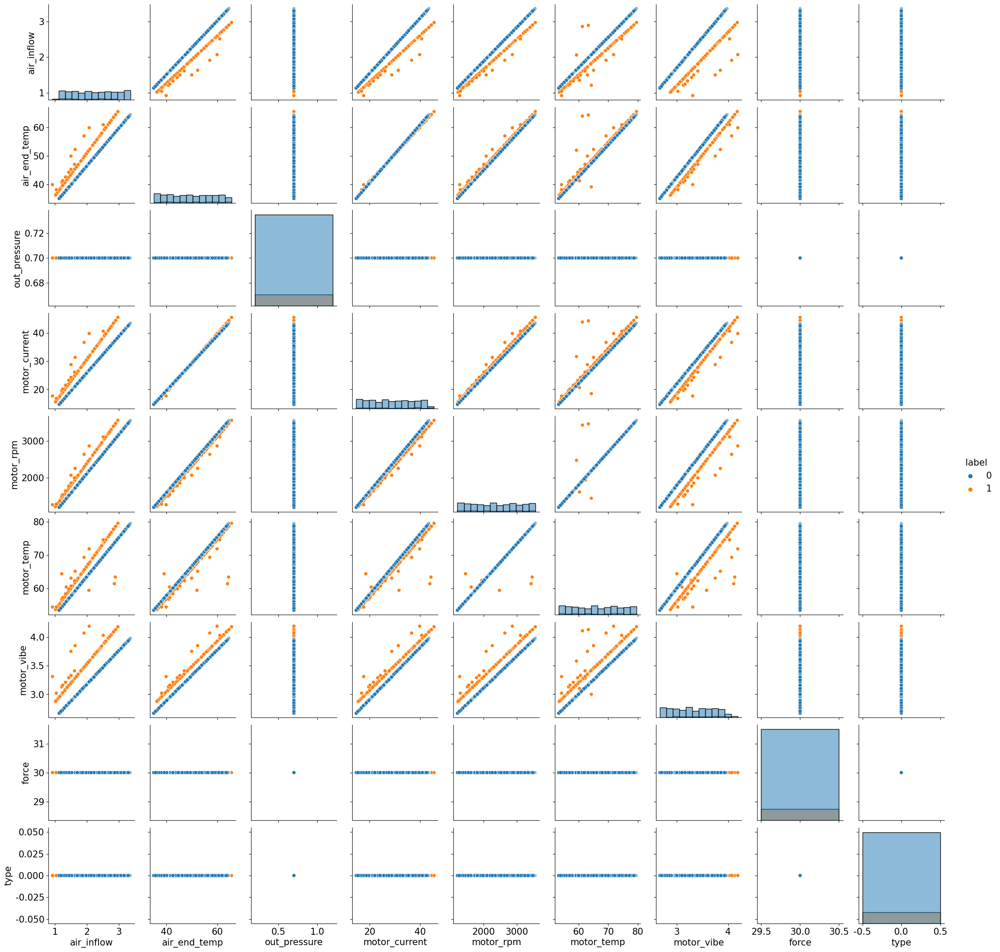

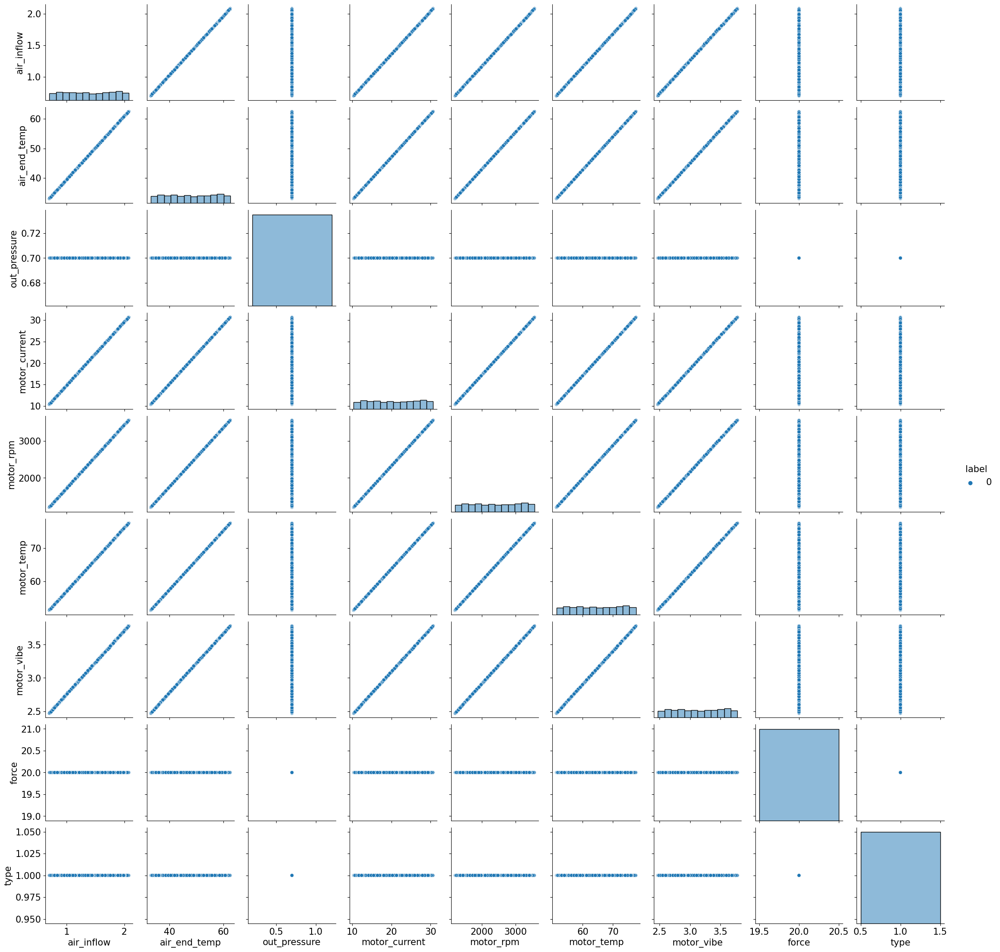

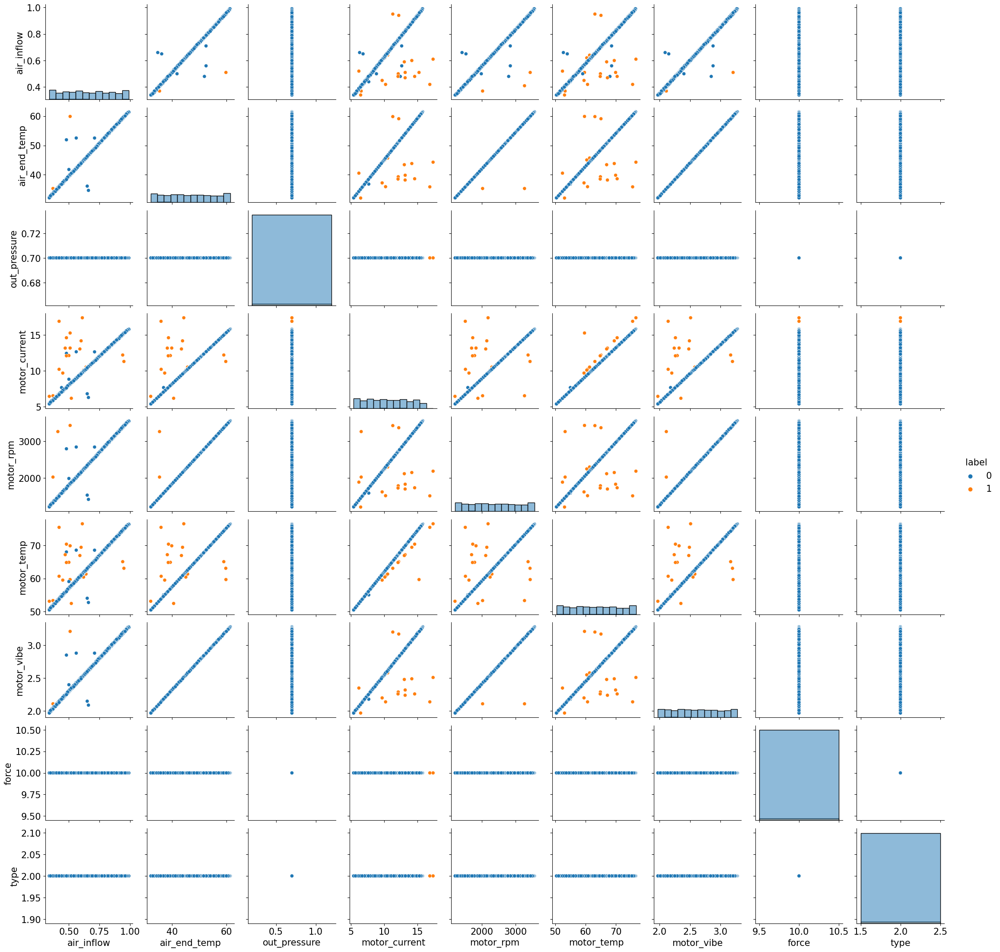

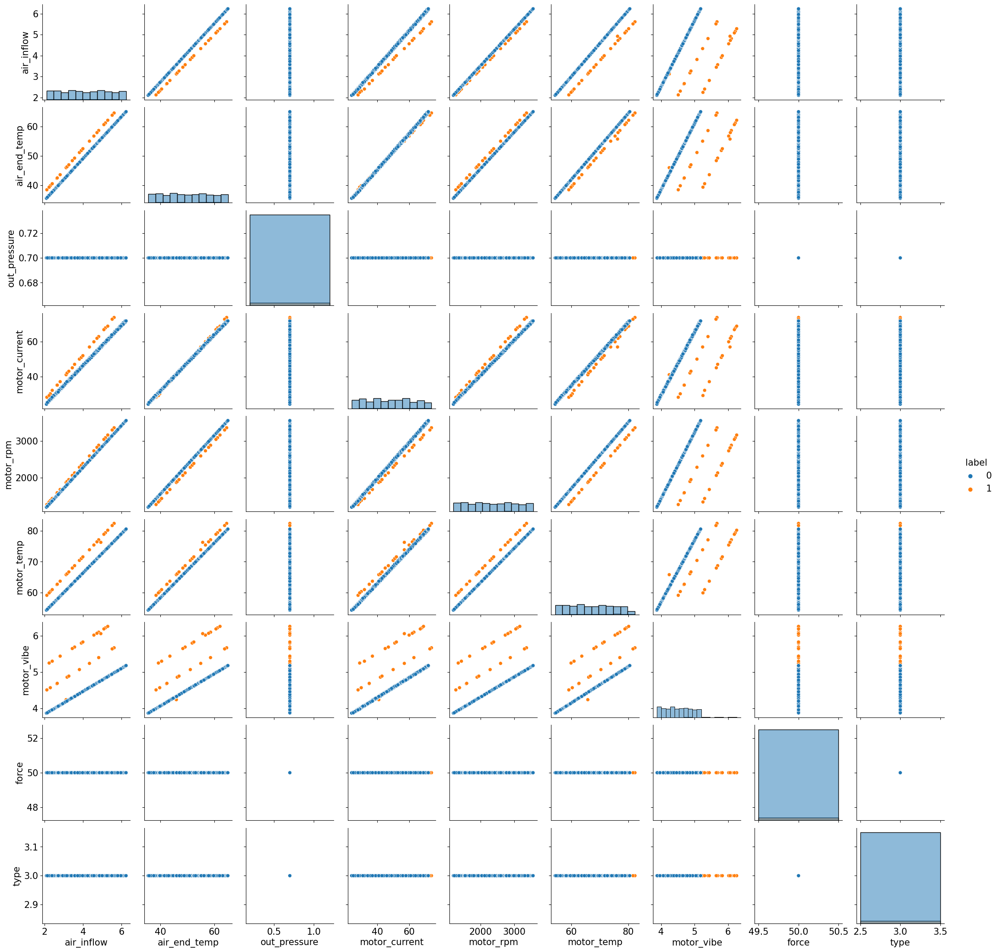

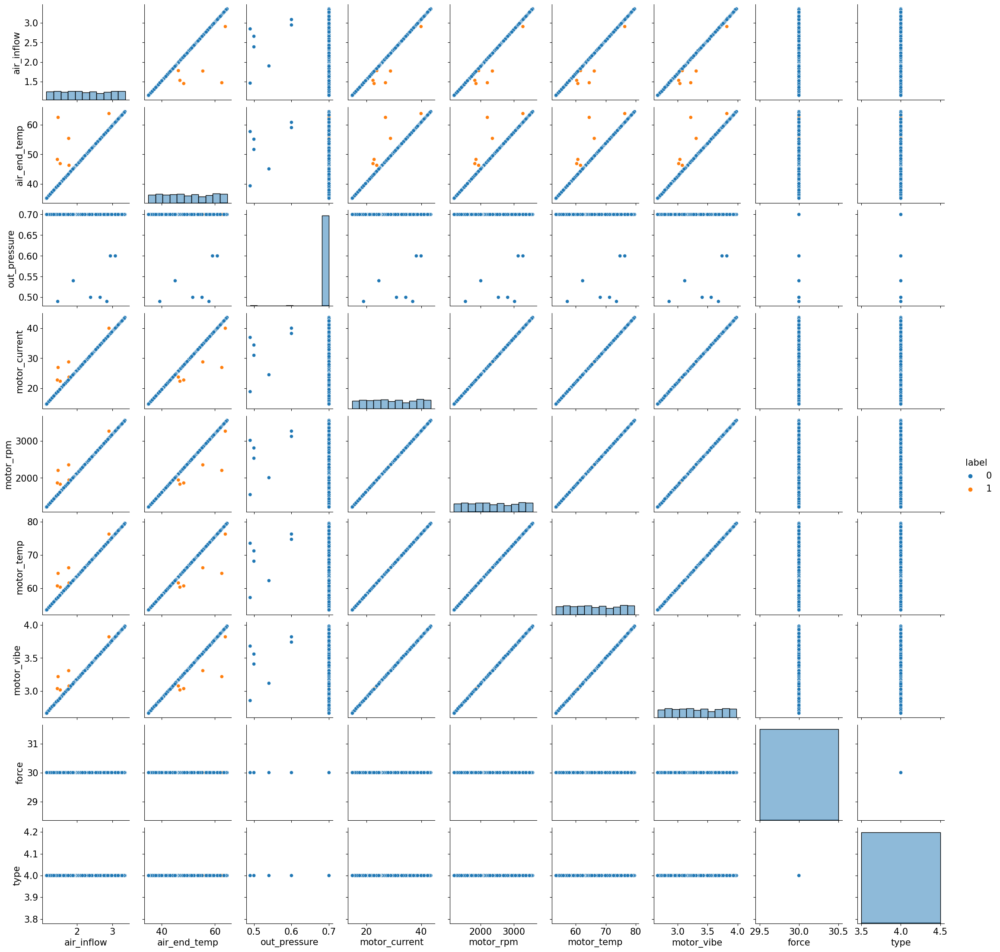

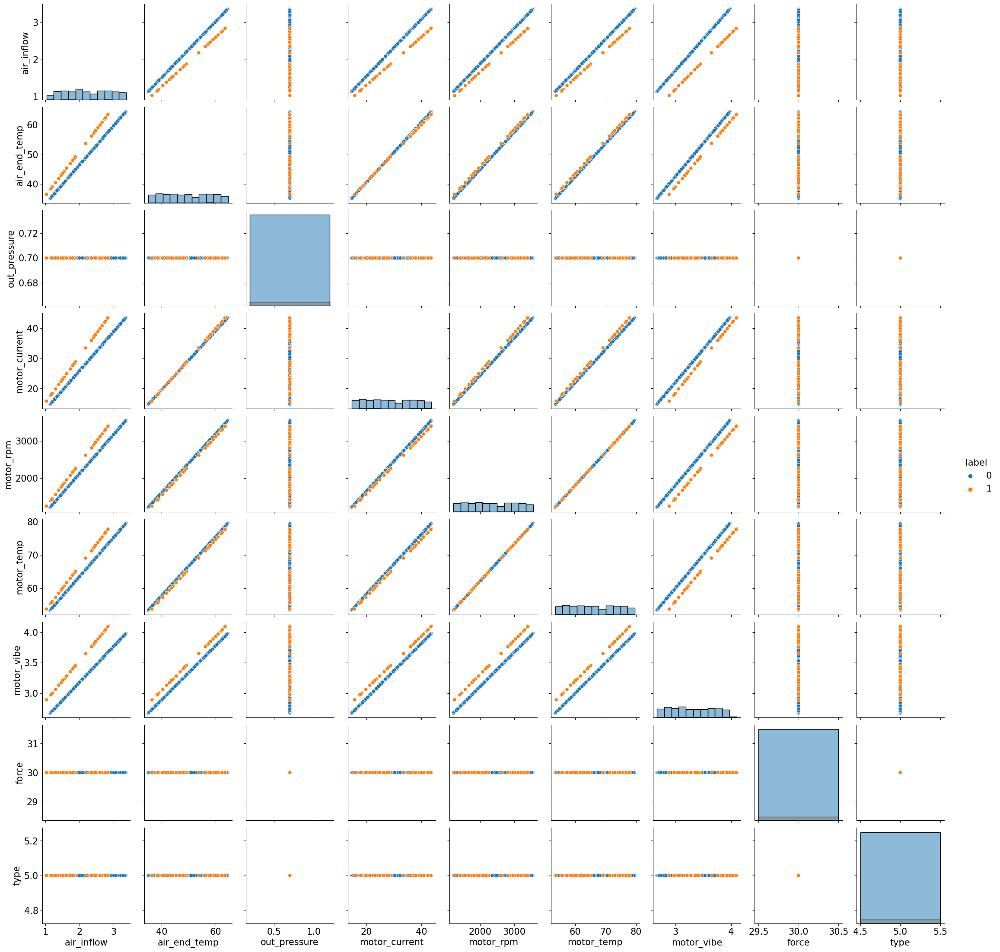

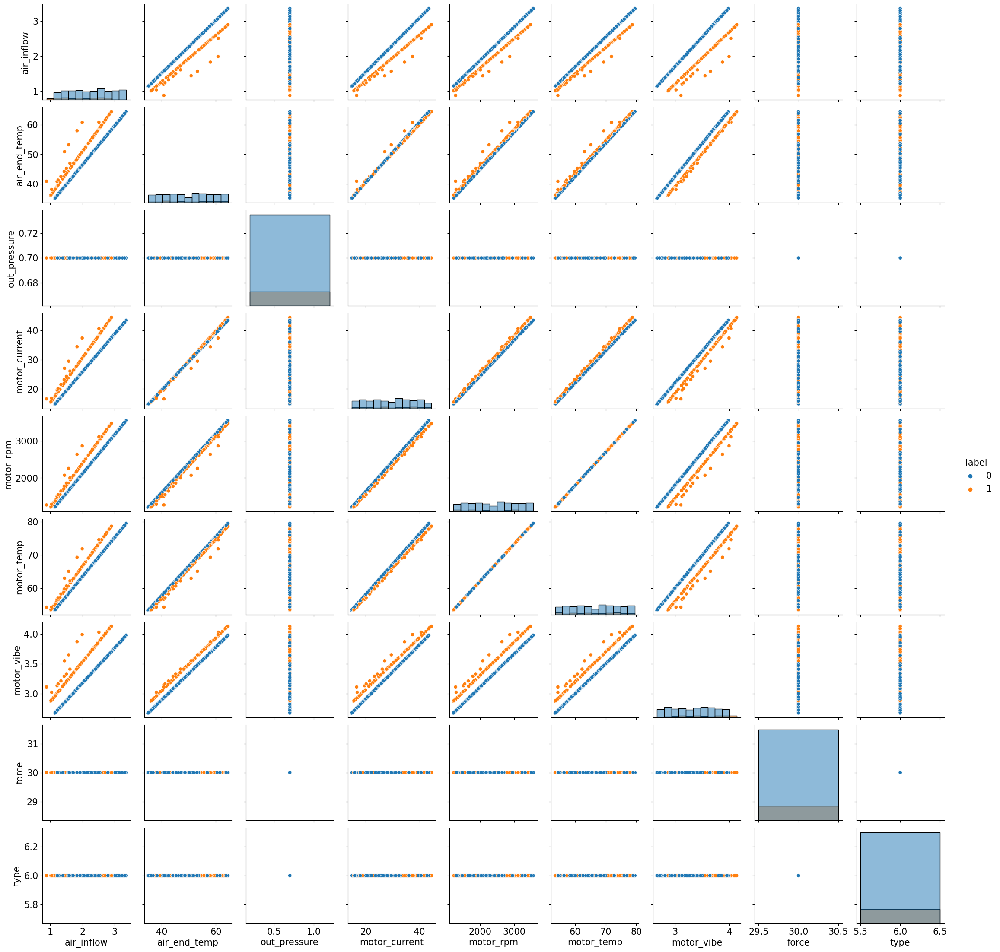

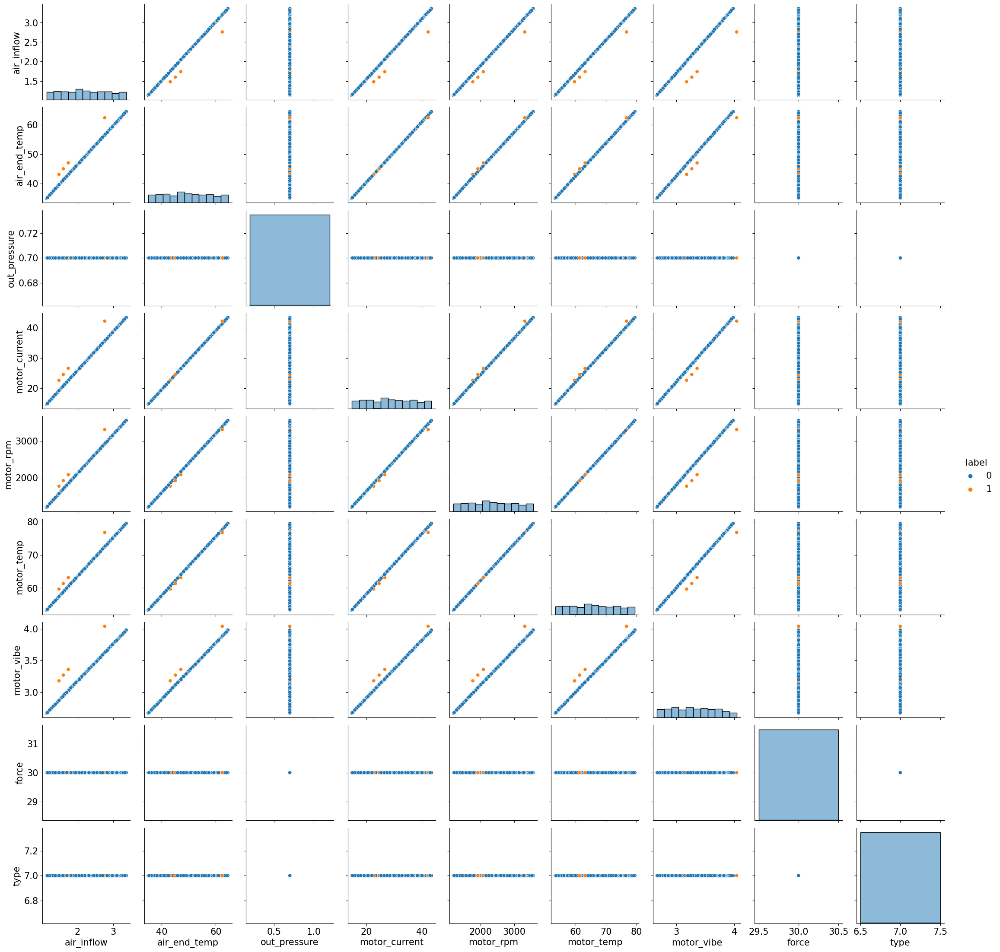

In [ ]:
# 최적
import seaborn as sns
for i in df['type'].unique():
	sns.pairplot(df.loc[df['type'] == i],diag_kind='hist',hue='label')

In [ ]:
df_train.corr(method='pearson')

,air_inflow,air_end_temp,out_pressure,motor_current,motor_rpm,motor_temp,motor_vibe,force,type
air_inflow,1.000000,0.636467,NaN,0.994585,0.549101,0.659138,0.347755,0.823294,0.169851
air_end_temp,0.636467,1.000000,NaN,0.703042,0.990302,0.999506,0.273699,0.165039,0.034830
out_pressure,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
motor_current,0.994585,0.703042,NaN,1.000000,0.619536,0.723685,0.353014,0.780123,0.160190
motor_rpm,0.549101,0.990302,NaN,0.619536,1.000000,0.986419,0.237544,0.044495,-0.015008
motor_temp,0.659138,0.999506,NaN,0.723685,0.986419,1.000000,0.282746,0.195220,0.040964
motor_vibe,0.347755,0.273699,NaN,0.353014,0.237544,0.282746,1.000000,0.267408,-0.023323
force,0.823294,0.165039,NaN,0.780123,0.044495,0.195220,0.267408,1.000000,0.240715
type,0.169851,0.034830,NaN,0.160190,-0.015008,0.040964,-0.023323,0.240715,1.000000


In [ ]:
df_test.corr(method='pearson')

,air_inflow,air_end_temp,out_pressure,motor_current,motor_rpm,motor_temp,motor_vibe,force,type
air_inflow,1.000000,0.610628,-0.007383,0.991016,0.518147,0.635348,0.946012,0.814605,0.186551
air_end_temp,0.610628,1.000000,-0.008984,0.685231,0.987989,0.995482,0.670457,0.122494,0.049235
out_pressure,-0.007383,-0.008984,1.000000,-0.007960,-0.006895,-0.009131,-0.002926,-0.005379,-0.013889
motor_current,0.991016,0.685231,-0.007960,1.000000,0.594143,0.706455,0.954707,0.768435,0.175325
motor_rpm,0.518147,0.987989,-0.006895,0.594143,1.000000,0.981809,0.588670,-0.004813,-0.003585
motor_temp,0.635348,0.995482,-0.009131,0.706455,0.981809,1.000000,0.691989,0.152482,0.055805
motor_vibe,0.946012,0.670457,-0.002926,0.954707,0.588670,0.691989,1.000000,0.773935,0.111714
force,0.814605,0.122494,-0.005379,0.768435,-0.004813,0.152482,0.773935,1.000000,0.240715
type,0.186551,0.049235,-0.013889,0.175325,-0.003585,0.055805,0.111714,0.240715,1.000000


In [ ]:
df_final = df[['type', 'label']]

In [ ]:
df_final.to_csv('gmm.csv', index=False)

In [ ]:
# import libraries
import os
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
import seaborn as sns
sns.set(color_codes=True)
import matplotlib.pyplot as plt
%matplotlib inline

from numpy.random import seed
import tensorflow as tf

from keras.layers import Input, Dropout, Dense, LSTM, TimeDistributed, RepeatVector
from keras.models import Model
from keras import regularizers

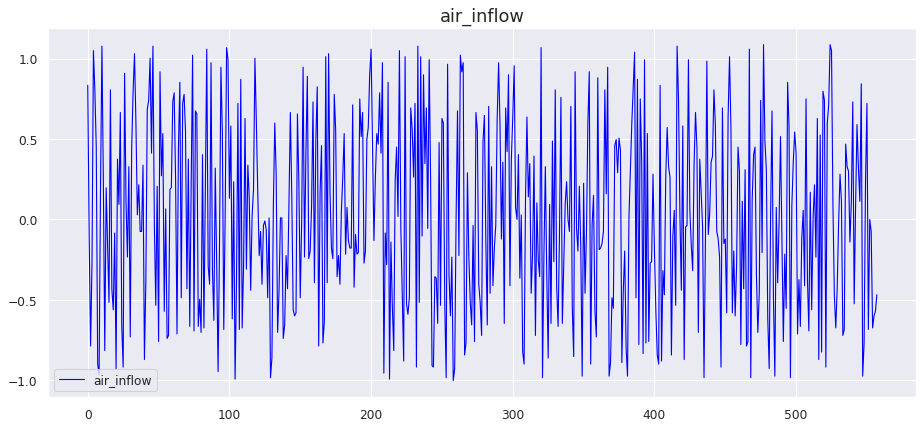

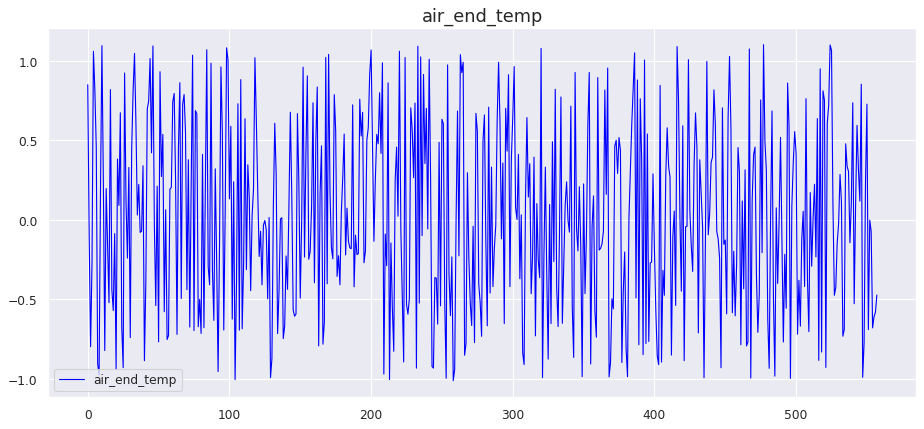

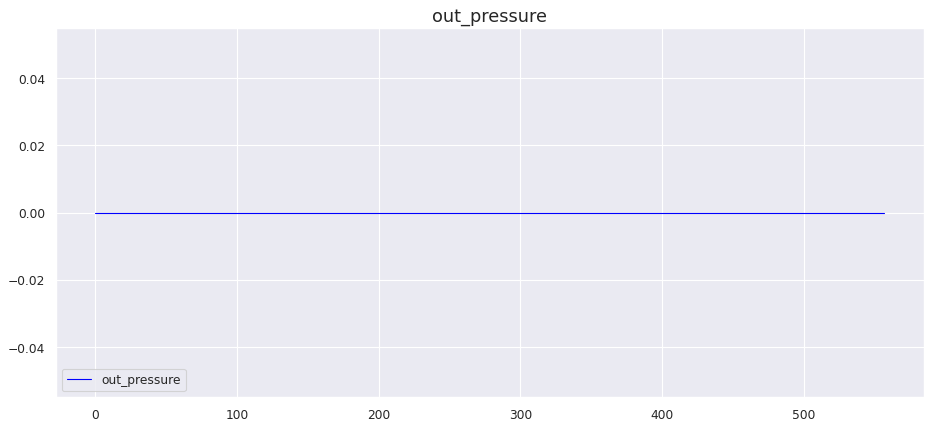

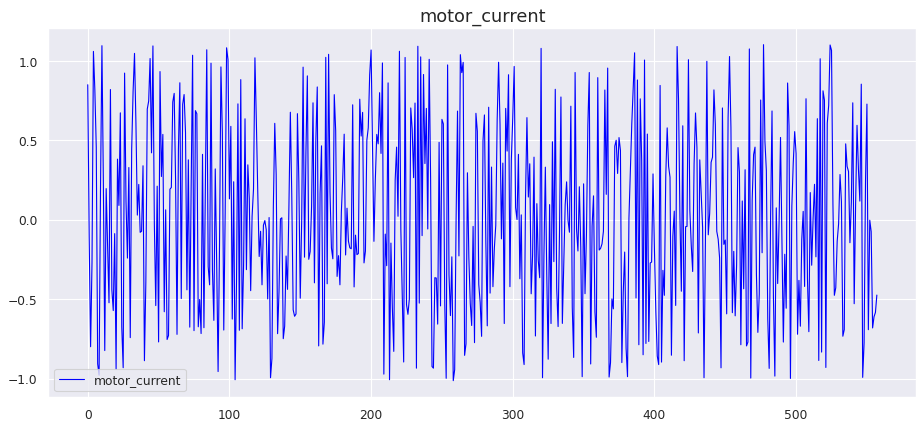

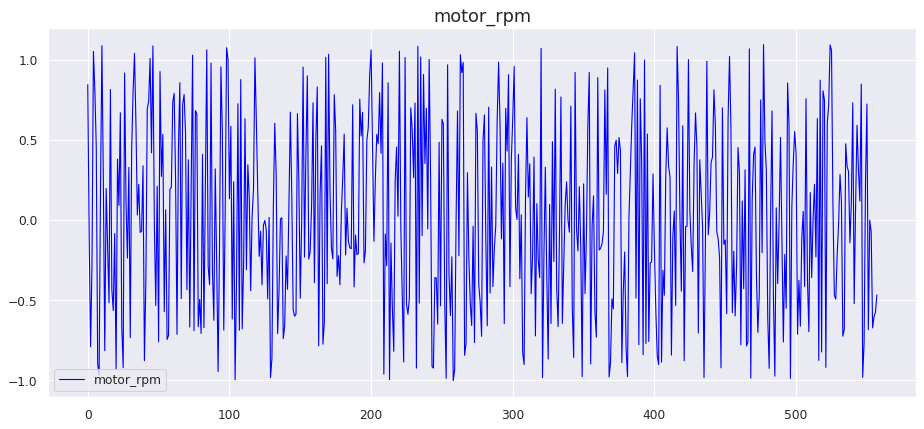

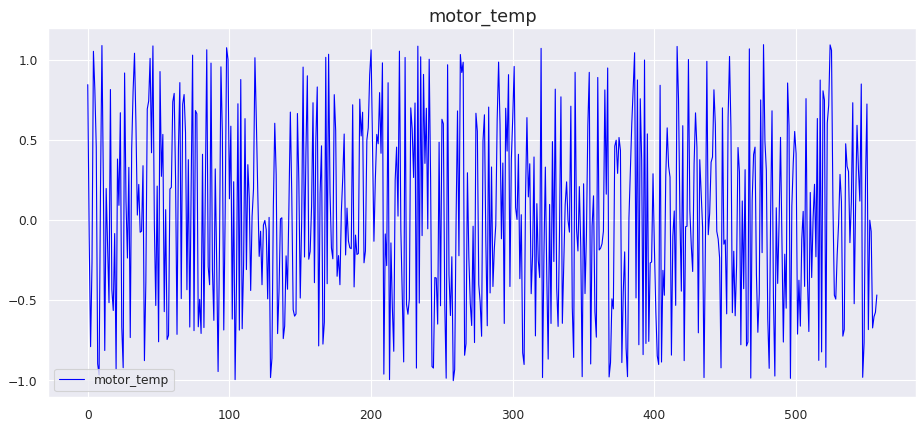

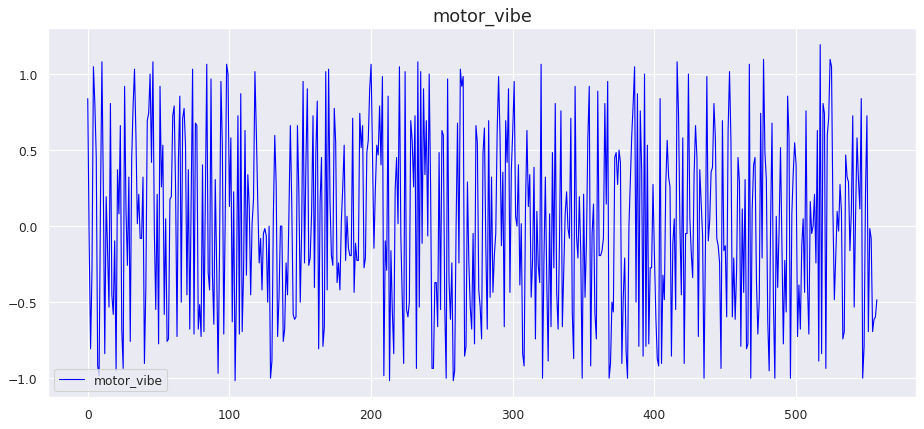

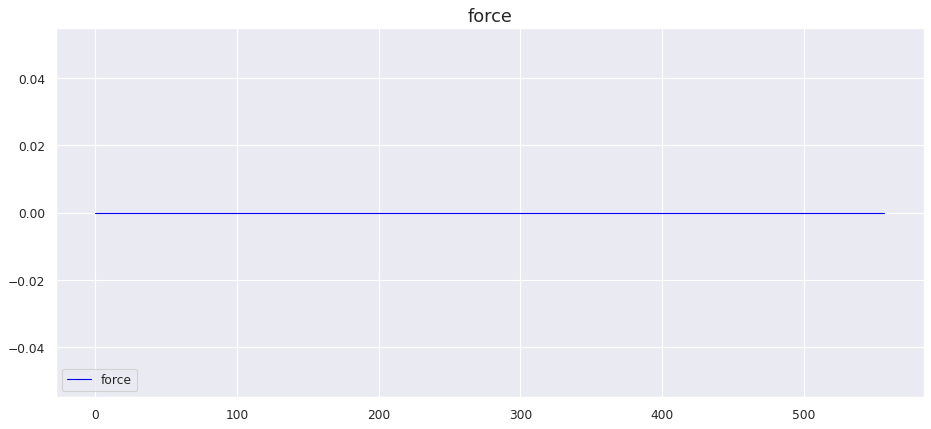

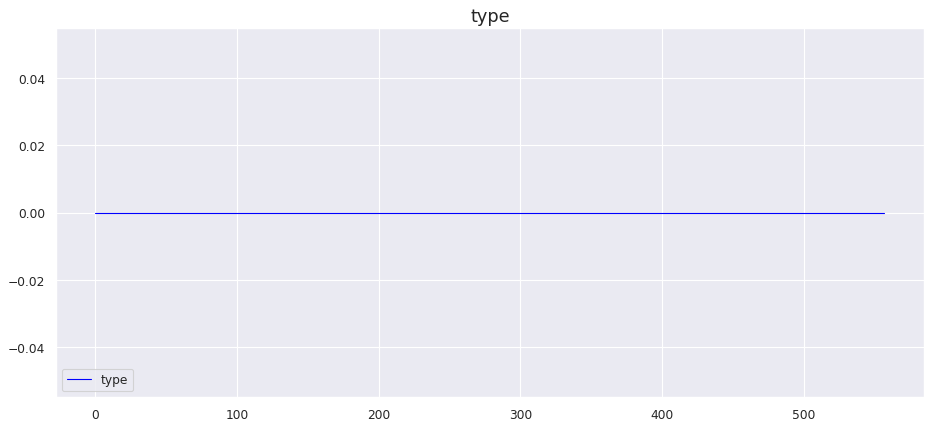

In [ ]:
for i in df_train.columns:
  fig, ax = plt.subplots(figsize=(14, 6), dpi=80)
  ax.plot(df_test_7[i], label=i, color='blue', animated = True, linewidth=1)
  #ax.plot(df_train_1, label='Bearing 1', color='red', animated = True, linewidth=1)
  #ax.plot(df_train_2, label='Bearing 2', color='green', animated = True, linewidth=1)
  #ax.plot(df_train['Bearing 3'], label='Bearing 3', color='black', animated = True, linewidth=1)
  plt.legend(loc='lower left')
  ax.set_title(i, fontsize=16)
  plt.show()

In [ ]:
# transforming data from the time domain to the frequency domain using fast Fourier transform
train_fft = np.fft.fft(df_train)
test_fft = np.fft.fft(df_test)

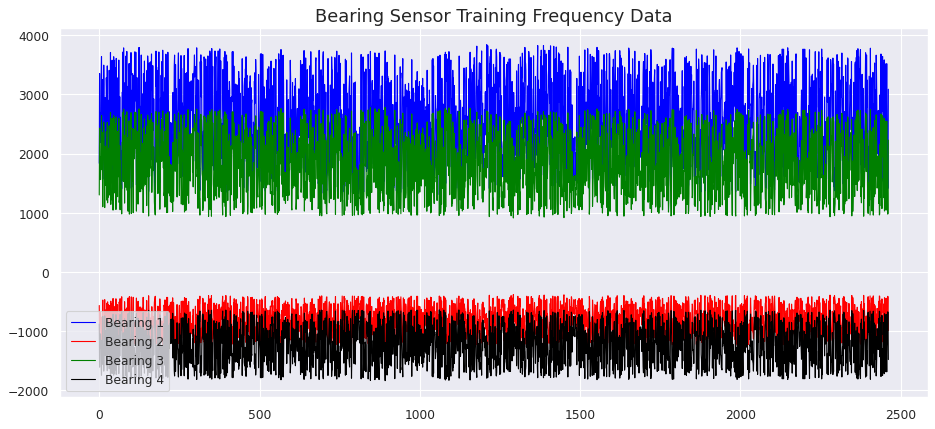

In [ ]:
# frequencies of the healthy sensor signal
fig, ax = plt.subplots(figsize=(14, 6), dpi=80)
ax.plot(train_fft[:,0].real, label='Bearing 1', color='blue', animated = True, linewidth=1)
ax.plot(train_fft[:,1].imag, label='Bearing 2', color='red', animated = True, linewidth=1)
ax.plot(train_fft[:,2].real, label='Bearing 3', color='green', animated = True, linewidth=1)
ax.plot(train_fft[:,3].real, label='Bearing 4', color='black', animated = True, linewidth=1)
plt.legend(loc='lower left')
ax.set_title('Bearing Sensor Training Frequency Data', fontsize=16)
plt.show()

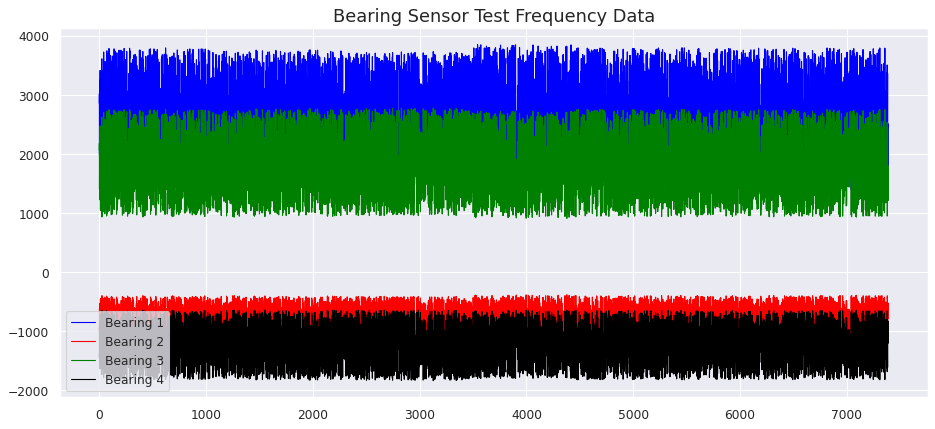

In [ ]:
# frequencies of the degrading sensor signal
fig, ax = plt.subplots(figsize=(14, 6), dpi=80)
ax.plot(test_fft[:,0].real, label='Bearing 1', color='blue', animated = True, linewidth=1)
ax.plot(test_fft[:,1].imag, label='Bearing 2', color='red', animated = True, linewidth=1)
ax.plot(test_fft[:,2].real, label='Bearing 3', color='green', animated = True, linewidth=1)
ax.plot(test_fft[:,3].real, label='Bearing 4', color='black', animated = True, linewidth=1)
plt.legend(loc='lower left')
ax.set_title('Bearing Sensor Test Frequency Data', fontsize=16)
plt.show()

In [ ]:
import joblib
# normalize the data
scaler = RobustScaler()
X_train = scaler.fit_transform(df_train)
X_test = scaler.transform(df_test)
scaler_filename = "scaler_data"
joblib.dump(scaler, scaler_filename)

['scaler_data']

In [ ]:
# reshape inputs for LSTM [samples, timesteps, features]
X_train = X_train.reshape(X_train.shape[0], 1, X_train.shape[1])
print("Training data shape:", X_train.shape)
X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
print("Test data shape:", X_test.shape)

Training data shape: (2463, 1, 9)
Test data shape: (7389, 1, 9)


In [ ]:
# define the autoencoder network model
def autoencoder_model(X):
    inputs = Input(shape=(X.shape[1], X.shape[2]))
    L1 = LSTM(16, activation='relu', return_sequences=True, 
              kernel_regularizer=regularizers.l2(0.00))(inputs)
    L2 = LSTM(4, activation='relu', return_sequences=False)(L1)
    L3 = RepeatVector(X.shape[1])(L2)
    L4 = LSTM(4, activation='relu', return_sequences=True)(L3)
    L5 = LSTM(16, activation='relu', return_sequences=True)(L4)
    output = TimeDistributed(Dense(X.shape[2]))(L5)    
    model = Model(inputs=inputs, outputs=output)
    return model

In [ ]:
# create the autoencoder model
model = autoencoder_model(X_train)
model.compile(optimizer='adam', loss='mae')
model.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 1, 9)]            0         
                                                                 
 lstm_4 (LSTM)               (None, 1, 16)             1664      
                                                                 
 lstm_5 (LSTM)               (None, 4)                 336       
                                                                 
 repeat_vector_1 (RepeatVect  (None, 1, 4)             0         
 or)                                                             
                                                                 
 lstm_6 (LSTM)               (None, 1, 4)              144       
                                                                 
 lstm_7 (LSTM)               (None, 1, 16)             1344      
                                                           

In [ ]:
# fit the model to the data
nb_epochs = 100
batch_size = 10
history = model.fit(X_train, X_train, epochs=nb_epochs, batch_size=batch_size,
                    validation_split=0.05).history

Epoch 1/100
234/234 [==============================] - 9s 10ms/step - loss: 0.4799 - val_loss: 0.4028
Epoch 2/100
234/234 [==============================] - 1s 6ms/step - loss: 0.3602 - val_loss: 0.3034
Epoch 3/100
234/234 [==============================] - 2s 8ms/step - loss: 0.3073 - val_loss: 0.2319
Epoch 4/100
234/234 [==============================] - 2s 9ms/step - loss: 0.2750 - val_loss: 0.1870
Epoch 5/100
234/234 [==============================] - 2s 7ms/step - loss: 0.2529 - val_loss: 0.1443
Epoch 6/100
234/234 [==============================] - 2s 7ms/step - loss: 0.2206 - val_loss: 0.1304
Epoch 7/100
234/234 [==============================] - 2s 7ms/step - loss: 0.2044 - val_loss: 0.1239
Epoch 8/100
234/234 [==============================] - 2s 7ms/step - loss: 0.1953 - val_loss: 0.1267
Epoch 9/100
234/234 [==============================] - 2s 6ms/step - loss: 0.1889 - val_loss: 0.1241
Epoch 10/100
234/234 [==============================] - 2s 7ms/step - loss: 0.1765 - val_l

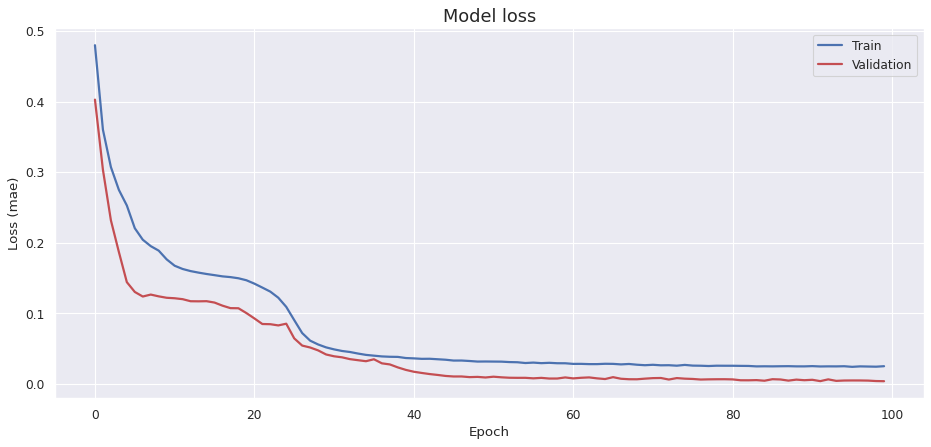

In [ ]:
# plot the training losses
fig, ax = plt.subplots(figsize=(14, 6), dpi=80)
ax.plot(history['loss'], 'b', label='Train', linewidth=2)
ax.plot(history['val_loss'], 'r', label='Validation', linewidth=2)
ax.set_title('Model loss', fontsize=16)
ax.set_ylabel('Loss (mae)')
ax.set_xlabel('Epoch')
ax.legend(loc='upper right')
plt.show()

77/77 [==============================] - 1s 3ms/step


<ipython-input-201-afe6109524a2>:12: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(scored['Loss_mae'], bins = 20, kde= True, color = 'blue');


(0.0, 0.5)

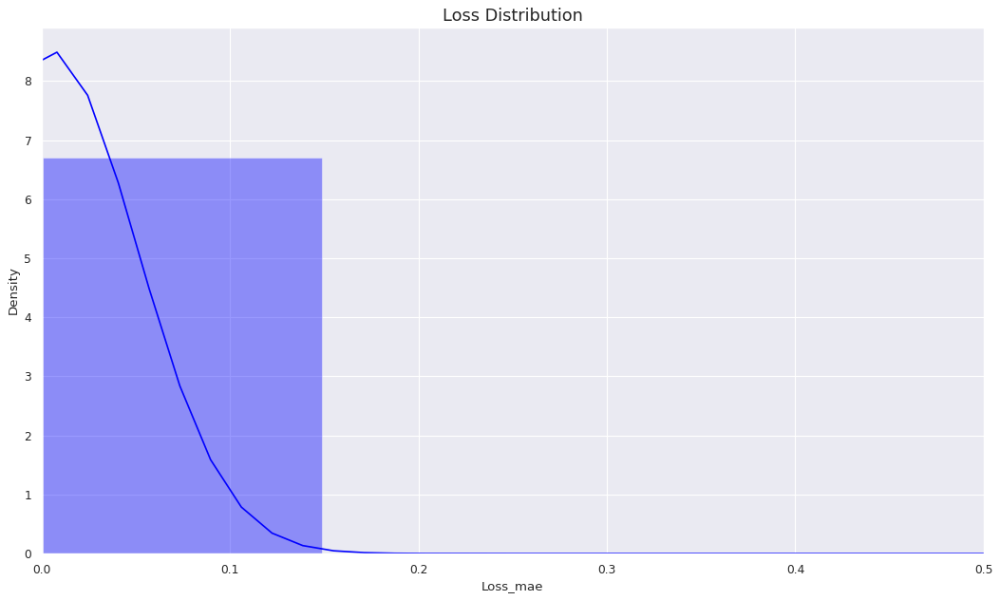

In [ ]:
# plot the loss distribution of the training set
X_pred = model.predict(X_train)
X_pred = X_pred.reshape(X_pred.shape[0], X_pred.shape[2])
X_pred = pd.DataFrame(X_pred, columns=df_train.columns)
X_pred.index = df_train.index

scored = pd.DataFrame(index=df_train.index)
Xtrain = X_train.reshape(X_train.shape[0], X_train.shape[2])
scored['Loss_mae'] = np.mean(np.abs(X_pred-Xtrain), axis = 1)
plt.figure(figsize=(16,9), dpi=80)
plt.title('Loss Distribution', fontsize=16)
sns.distplot(scored['Loss_mae'], bins = 20, kde= True, color = 'blue');
plt.xlim([0.0,.5])

In [ ]:
# calculate the loss on the test set
X_pred = model.predict(X_test)
X_pred = X_pred.reshape(X_pred.shape[0], X_pred.shape[2])
X_pred = pd.DataFrame(X_pred, columns=df_test.columns)
X_pred.index = df_test.index

scored = pd.DataFrame(index=df_test.index)
Xtest = X_test.reshape(X_test.shape[0], X_test.shape[2])
scored['Loss_mae'] = np.mean(np.abs(X_pred-Xtest), axis = 1)
scored['Threshold'] = 0.275
scored['Anomaly'] = scored['Loss_mae'] > scored['Threshold']
scored.head()

231/231 [==============================] - 1s 3ms/step


,Loss_mae,Threshold,Anomaly
0,0.004164,0.275,False
1,0.003300,0.275,False
2,0.003774,0.275,False
3,0.003642,0.275,False
4,0.002913,0.275,False


In [ ]:
# calculate the same metrics for the training set 
# and merge all data in a single dataframe for plotting
X_pred_train = model.predict(X_train)
X_pred_train = X_pred_train.reshape(X_pred_train.shape[0], X_pred_train.shape[2])
X_pred_train = pd.DataFrame(X_pred_train, columns=df_train.columns)
X_pred_train.index = df_train.index

scored_train = pd.DataFrame(index=df_train.index)
scored_train['Loss_mae'] = np.mean(np.abs(X_pred_train-Xtrain), axis = 1)
scored_train['Threshold'] = 0.275
scored_train['Anomaly'] = scored_train['Loss_mae'] > scored_train['Threshold']
scored = pd.concat([scored_train, scored])

77/77 [==============================] - 0s 4ms/step


<Axes: >

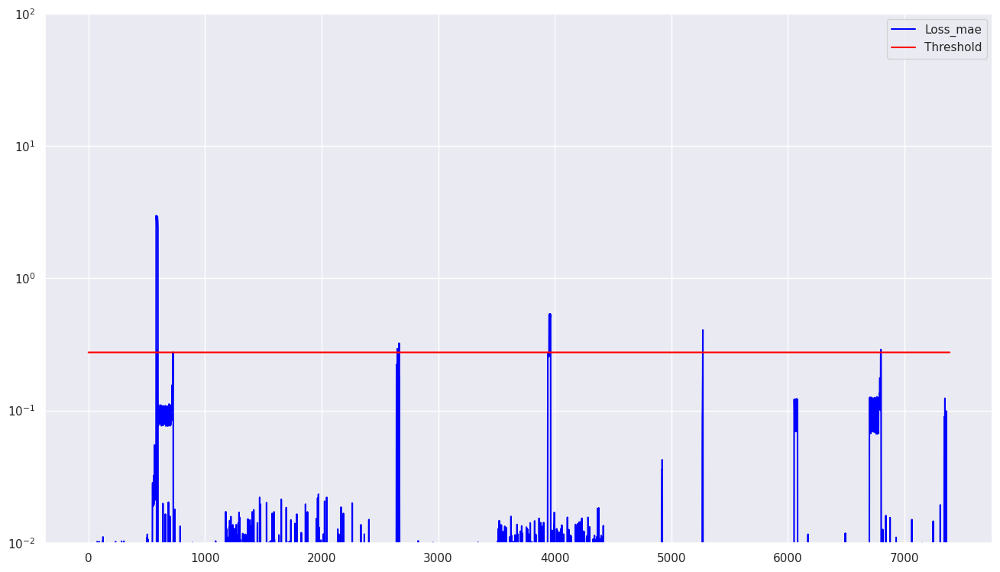

In [ ]:
# plot bearing failure time plot
scored.plot(logy=True,  figsize=(16,9), ylim=[1e-2,1e2], color=['blue','red'])

In [ ]:
# save all model information, including weights, in h5 format
model.save("Cloud_model.h5")
print("Model saved")

Model saved


In [ ]:
scored[scored['Anomaly']!=False]

,Loss_mae,Threshold,Anomaly
581,2.967599,0.275,True
582,2.833785,0.275,True
583,2.762630,0.275,True
584,2.915551,0.275,True
585,2.494843,0.275,True
586,2.858574,0.275,True
587,2.786307,0.275,True
588,2.949229,0.275,True
589,2.658332,0.275,True
590,2.593293,0.275,True


<ipython-input-209-28d58e2cdab3>:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  ax.scatter(test_[scored['Anomaly']==True]['Target1'].index,test_[scored['Anomaly']==1]['Target1'],label='anomal',marker='.', color='red')


IndexError: ignored

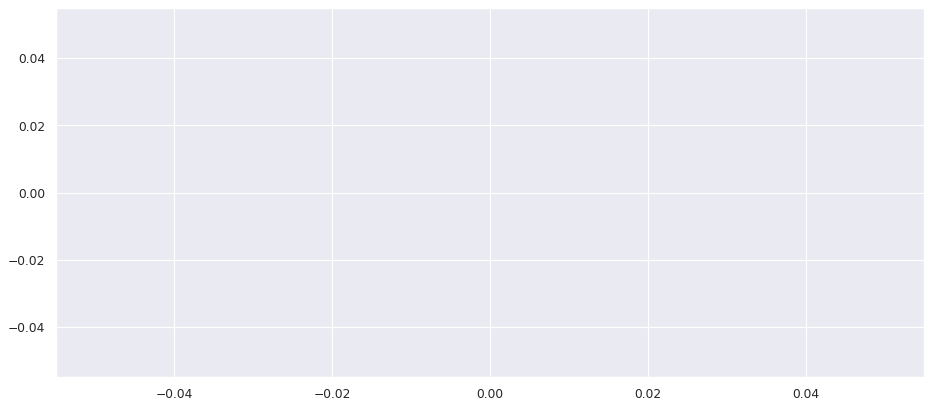

In [ ]:
#whole test data
test_ = pd.DataFrame(df_test,columns=['Target1','Target2','label'])

#make plot
fig, ax = plt.subplots(figsize=(14, 6), dpi=80)
ax.plot(test_['Target1'], label='Target1', color='blue', animated = True, linewidth=1)
ax.scatter(test_[scored['Anomaly']==True]['Target1'].index,test_[scored['Anomaly']==1]['Target1'],label='anomal',marker='.', color='red')
ax.plot(test_['Target2'], label='Target2', color='black', animated = True, linewidth=1)
ax.scatter(test_[scored['Anomaly']==1]['Target2'].index,test_[scored['Anomaly']==1]['Target2'], marker='.', color='red')
plt.legend(loc='lower left')
ax.set_title('ECG Test Data', fontsize=16)
plt.axvspan(min(test_[test_['label']==1].index), max(test_[test_['label']==1].index), facecolor='gray', alpha=0.3)

plt.show()


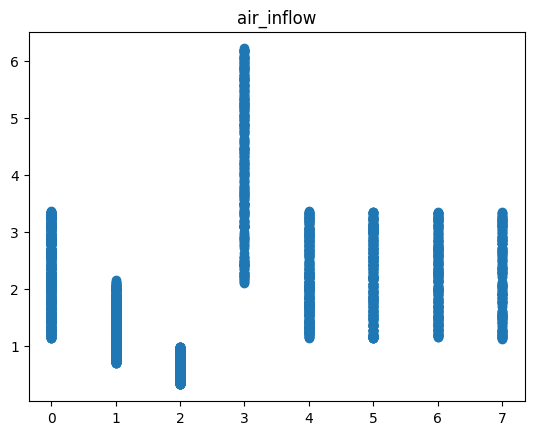

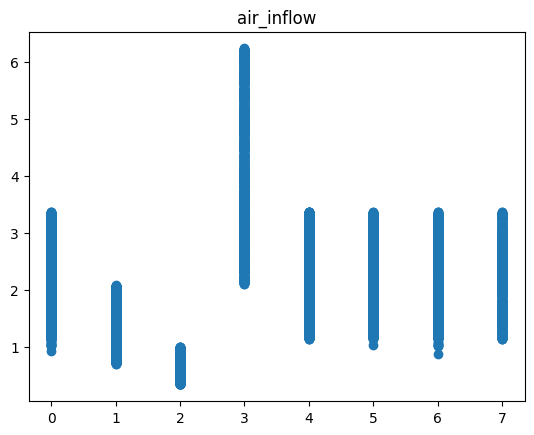

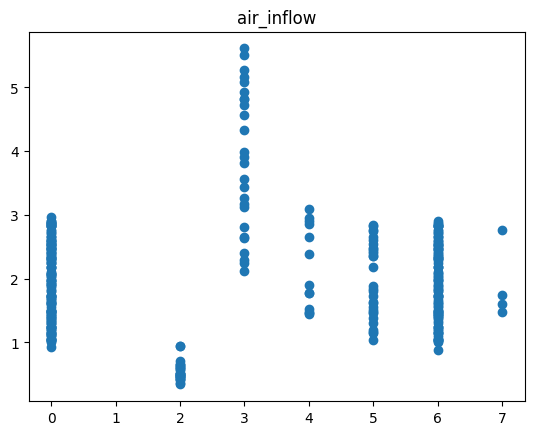

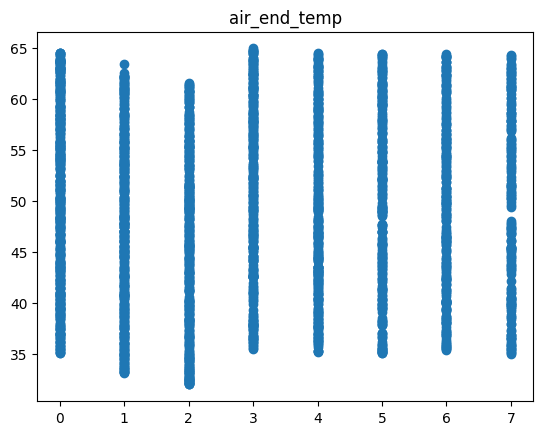

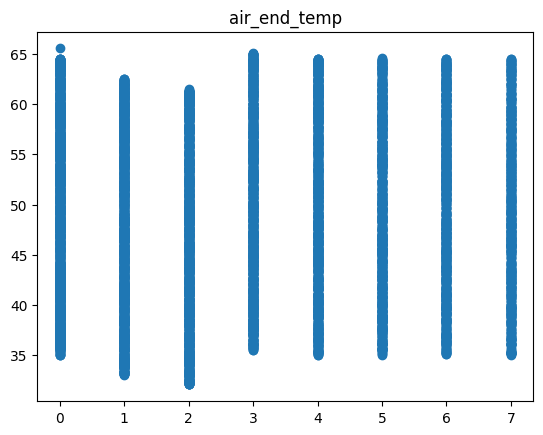

...

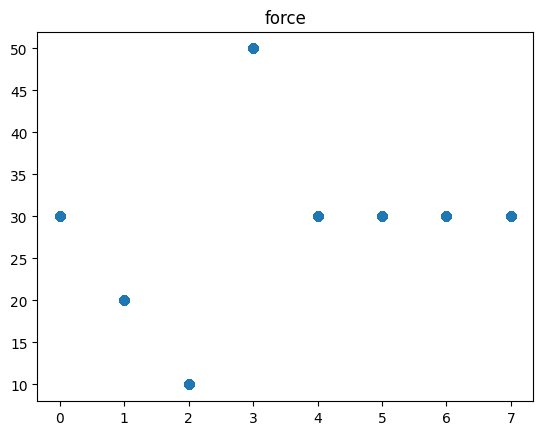

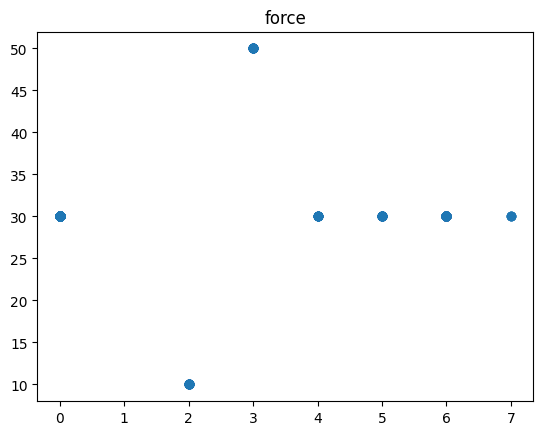

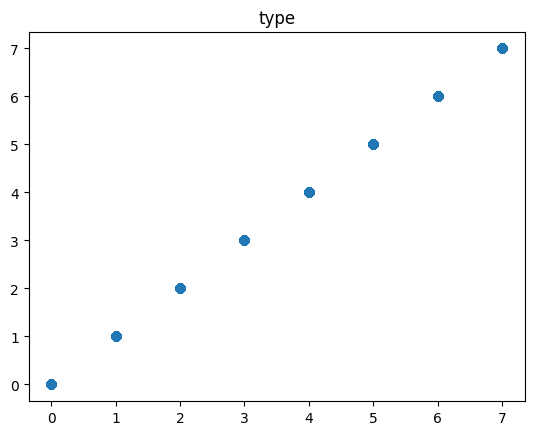

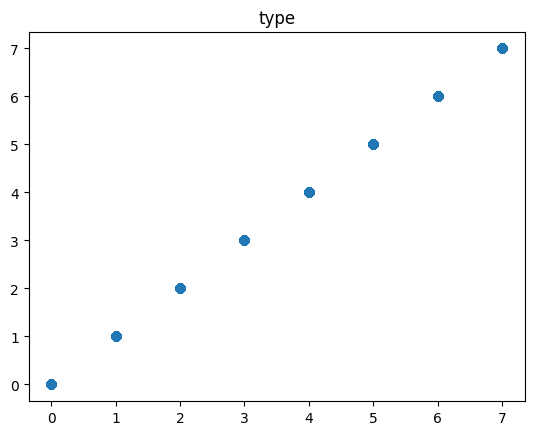

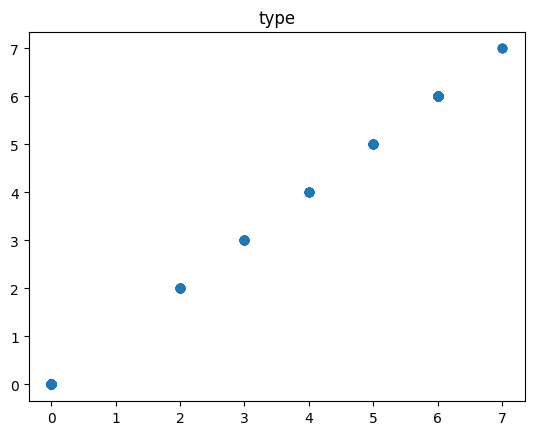

In [ ]:
for i in df_train.columns:
  plt.scatter(df_train['type'], df_train[i])
  plt.title(i)
  plt.show()
  plt.scatter(df_test['type'], df_test[i])
  plt.title(i)
  plt.show()
  plt.scatter(anomalies['type'], anomalies[i])
  plt.title(i)
  plt.show()

In [ ]:
# import libraries
import os
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
import joblib
import seaborn as sns
sns.set(color_codes=True)
import matplotlib.pyplot as plt
%matplotlib inline

from numpy.random import seed
import tensorflow as tf


from keras.layers import Input, Dropout, Dense, LSTM, TimeDistributed, RepeatVector
from keras.models import Model
from keras import regularizers

In [ ]:
df_train.columns

Index(['air_inflow', 'air_end_temp', 'out_pressure', 'motor_current',
       'motor_rpm', 'motor_temp', 'motor_vibe', 'force', 'type'],
      dtype='object')

In [ ]:
#only use target 1 & target 2
feature = df_train.columns
train = pd.DataFrame(df_train,columns=feature).iloc[:,:9]
test = pd.DataFrame(df_test,columns=feature).iloc[:,:9]

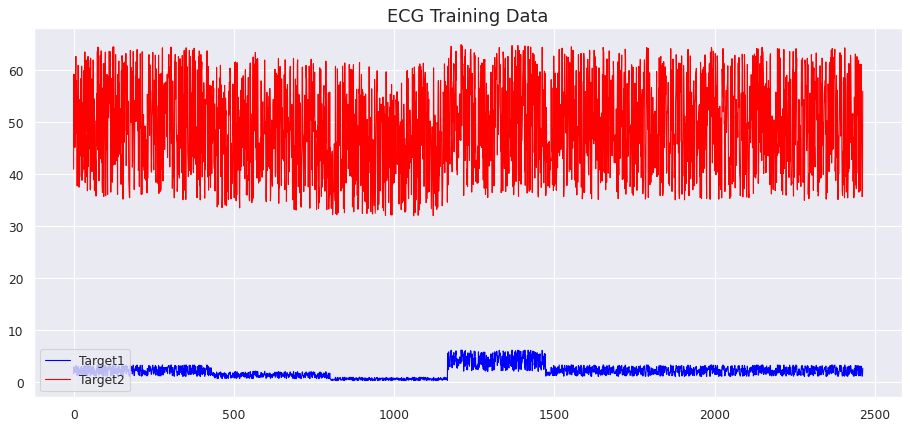

In [ ]:
# train data plot
fig, ax = plt.subplots(figsize=(14, 6), dpi=80)
ax.plot(train[df_train.columns[0]], label='Target1', color='blue', animated = True, linewidth=1)
ax.plot(train[df_train.columns[1]], label='Target2', color='red', animated = True, linewidth=1)
plt.legend(loc='lower left')
ax.set_title('ECG Training Data', fontsize=16)
plt.show()

In [ ]:
# normalize the data
scaler = MinMaxScaler()
X_train = scaler.fit_transform(train)
X_test = scaler.transform(test)
#scaler_filename = "data/ecg/real_scaler_data"
#joblib.dump(scaler, scaler_filename)

In [ ]:
# reshape inputs for LSTM [samples, timesteps, features]
X_train,X_test = np.array(train),np.array(test)


X_train = X_train.reshape(X_train.shape[0], 1, X_train.shape[1])
print("Training data shape:", X_train.shape)
X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
print("Test data shape:", X_test.shape)

Training data shape: (2463, 1, 9)
Test data shape: (7389, 1, 9)


In [ ]:
# define the autoencoder network model
def autoencoder_model(X):
    inputs = Input(shape=(X.shape[1], X.shape[2]))
    L1 = LSTM(24, activation='relu', return_sequences=True, 
              kernel_regularizer=regularizers.l2(0.00))(inputs)
    L2 = LSTM(10, activation='relu', return_sequences=False)(L1)
    L3 = RepeatVector(X.shape[1])(L2)
    L4 = LSTM(10, activation='relu', return_sequences=True)(L3)
    L5 = LSTM(24, activation='relu', return_sequences=True)(L4)
    output = TimeDistributed(Dense(X.shape[2]))(L5)    
    model = Model(inputs=inputs, outputs=output)
    return model

In [ ]:
# create the autoencoder model
model = autoencoder_model(X_train)
model.compile(optimizer='adam', loss='mae')
model.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 1, 9)]            0         
                                                                 
 lstm_12 (LSTM)              (None, 1, 24)             3264      
                                                                 
 lstm_13 (LSTM)              (None, 10)                1400      
                                                                 
 repeat_vector_3 (RepeatVect  (None, 1, 10)            0         
 or)                                                             
                                                                 
 lstm_14 (LSTM)              (None, 1, 10)             840       
                                                                 
 lstm_15 (LSTM)              (None, 1, 24)             3360      
                                                           

In [ ]:
# fit the model to the data
nb_epochs = 100
batch_size = 20
history = model.fit(X_train, X_train, epochs=nb_epochs, batch_size=batch_size,
                    validation_split=0.05).history

Epoch 1/100
117/117 [==============================] - 8s 12ms/step - loss: 278.4843 - val_loss: 263.7040
Epoch 2/100
117/117 [==============================] - 1s 7ms/step - loss: 259.7001 - val_loss: 252.0560
Epoch 3/100
117/117 [==============================] - 1s 6ms/step - loss: 167.0724 - val_loss: 7.2343
Epoch 4/100
117/117 [==============================] - 1s 7ms/step - loss: 7.2414 - val_loss: 6.1794
Epoch 5/100
117/117 [==============================] - 1s 7ms/step - loss: 6.5248 - val_loss: 5.6037
Epoch 6/100
117/117 [==============================] - 1s 7ms/step - loss: 5.9770 - val_loss: 4.8676
Epoch 7/100
117/117 [==============================] - 1s 7ms/step - loss: 5.6081 - val_loss: 4.8546
Epoch 8/100
117/117 [==============================] - 1s 7ms/step - loss: 5.2180 - val_loss: 4.4670
Epoch 9/100
117/117 [==============================] - 1s 7ms/step - loss: 4.8764 - val_loss: 4.0733
Epoch 10/100
117/117 [==============================] - 1s 10ms/step - loss: 4.7

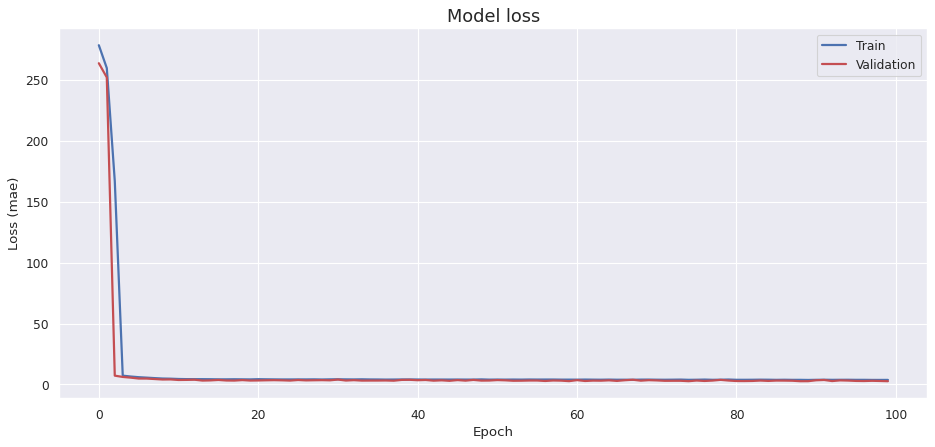

In [ ]:
# plot the training losses
fig, ax = plt.subplots(figsize=(14, 6), dpi=80)
ax.plot(history['loss'], 'b', label='Train', linewidth=2)
ax.plot(history['val_loss'], 'r', label='Validation', linewidth=2)
ax.set_title('Model loss', fontsize=16)
ax.set_ylabel('Loss (mae)')
ax.set_xlabel('Epoch')
ax.legend(loc='upper right')
plt.show()

77/77 [==============================] - 1s 2ms/step


<ipython-input-265-9cdd3566cb41>:12: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(scored['Loss_mae'], bins = 20, kde= True, color = 'blue');


(0.0, 0.1)

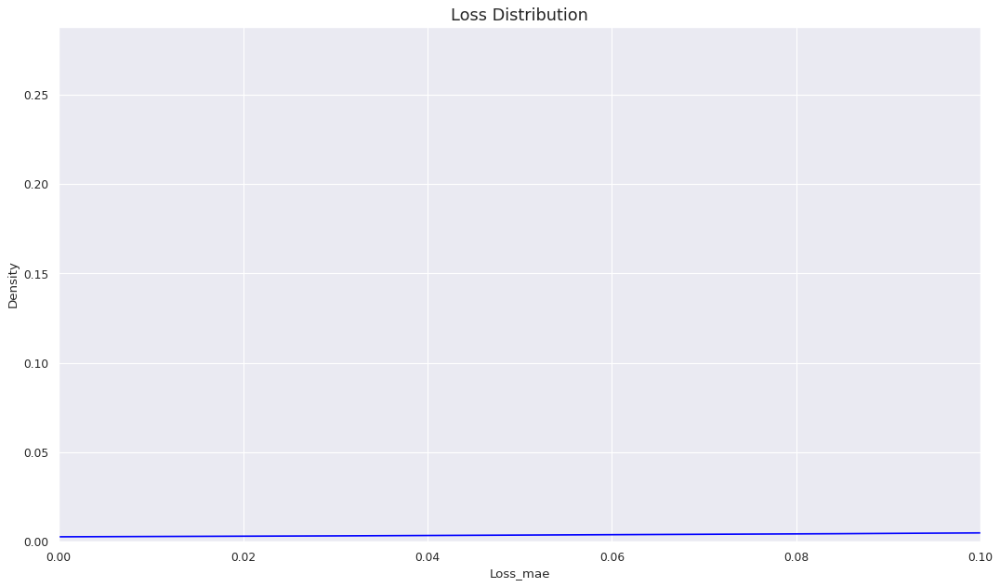

In [ ]:
# plot the loss distribution of the training set
X_pred = model.predict(X_train)
X_pred = X_pred.reshape(X_pred.shape[0], X_pred.shape[2])
X_pred = pd.DataFrame(X_pred, columns=train.columns)
X_pred.index = train.index

scored = pd.DataFrame(index=train.index)
Xtrain = X_train.reshape(X_train.shape[0], X_train.shape[2])
scored['Loss_mae'] = np.mean(np.abs(X_pred-Xtrain), axis = 1)
plt.figure(figsize=(16,9), dpi=80)
plt.title('Loss Distribution', fontsize=16)
sns.distplot(scored['Loss_mae'], bins = 20, kde= True, color = 'blue');
plt.xlim([0.0,0.1])

In [ ]:
# calculate the loss on the test set
print('anomaly threshold = {}'.format(np.percentile(scored,100)))
threshold = np.percentile(scored,99.5)

X_pred = model.predict(X_test)
X_pred = X_pred.reshape(X_pred.shape[0], X_pred.shape[2])
X_pred = pd.DataFrame(X_pred, columns=test.columns)
X_pred.index = test.index

scored = pd.DataFrame(index=test.index)
Xtest = X_test.reshape(X_test.shape[0], X_test.shape[2])
scored['Loss_mae'] = np.mean(np.abs(X_pred-Xtest), axis = 1)
scored['Threshold'] = threshold
scored['Anomaly'] = scored['Loss_mae'] > scored['Threshold']
scored.head()

anomaly threshold = 14.949038430319895
231/231 [==============================] - 1s 6ms/step


,Loss_mae,Threshold,Anomaly
0,1.273954,8.44392,False
1,1.466644,8.44392,False
2,3.138305,8.44392,False
3,1.773735,8.44392,False
4,2.174107,8.44392,False


/usr/local/lib/python3.9/dist-packages/pandas/plotting/_matplotlib/core.py:698: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax.set_ylim(self.ylim)


<Axes: >

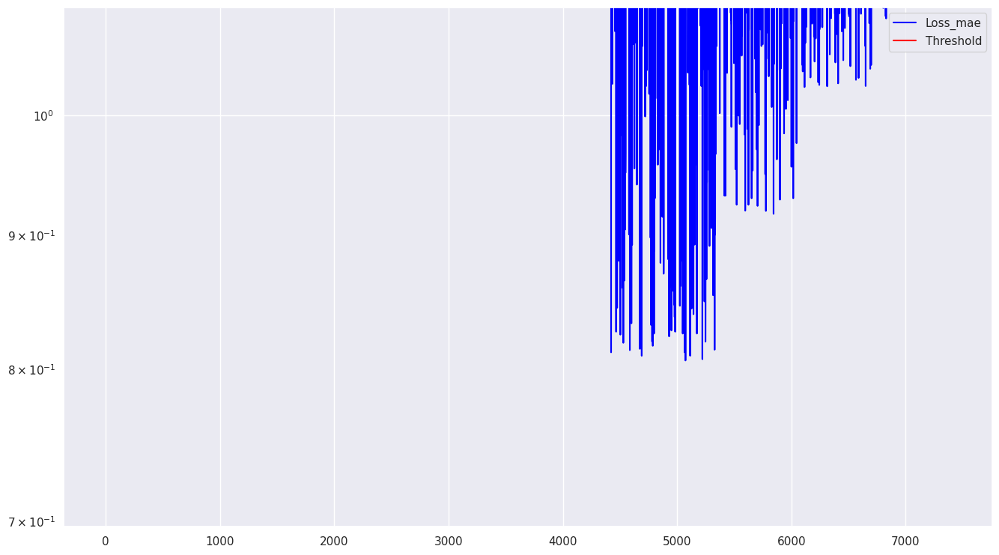

In [ ]:
# test set에 대한 결과
scored.plot(logy=True,  figsize=(16,9), ylim=[0,1.10], color=['blue','red'])

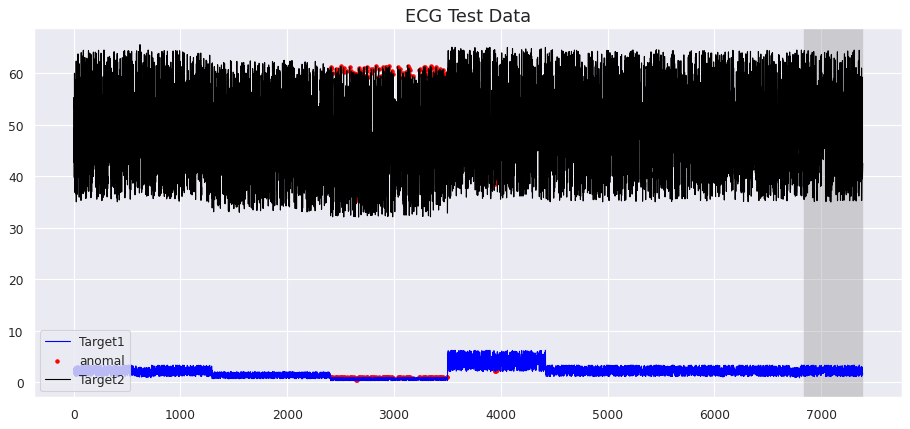

In [ ]:
#whole test data
test_ = pd.DataFrame(df_test,columns=df_test.columns)

#make plot
fig, ax = plt.subplots(figsize=(14, 6), dpi=80)
ax.plot(test_[df_test.columns[0]], label='Target1', color='blue', animated = True, linewidth=1)
ax.scatter(test_[scored['Anomaly']==1][df_test.columns[0]].index,test_[scored['Anomaly']==1][df_test.columns[0]],label='anomal',marker='.', color='red')
ax.plot(test_[df_test.columns[1]], label='Target2', color='black', animated = True, linewidth=1)
ax.scatter(test_[scored['Anomaly']==1][df_test.columns[1]].index,test_[scored['Anomaly']==1][df_test.columns[1]], marker='.', color='red')
plt.legend(loc='lower left')
ax.set_title('ECG Test Data', fontsize=16)
plt.axvspan(min(test_[test_['type']==7].index), max(test_[test_['type']==7].index), facecolor='gray', alpha=0.3)

plt.show()

In [ ]:
scored[scored['Anomaly']==True]

,Loss_mae,Threshold,Anomaly
2405,9.029102,8.44392,True
2412,9.102829,8.44392,True
2414,8.955439,8.44392,True
2426,8.754151,8.44392,True
2452,9.007932,8.44392,True
...,...,...,...
3948,9.052999,8.44392,True
3949,8.825708,8.44392,True
3954,8.946659,8.44392,True
3959,8.453431,8.44392,True
